In [206]:
ls

Annotated_Data.xlsx             dataframe_image.png
data_names_switchs.txt          more_data_statistic_sumary.txt
data_statistic_sumary.txt       relacao.ipynb


In [207]:
import pandas as pd
import glob
import os
from pathlib import Path
from scipy.stats import pearsonr
from numpy.linalg import eig
from numpy.linalg import eigh
import numpy as np
import datetime
from datetime import datetime, timedelta
import os, shutil
from numpy import nan
from itertools import groupby
import seaborn as sns
from scipy import linalg
import math
from sklearn.linear_model import LinearRegression
import pickle
import scipy.stats as stats
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [208]:
df=pd.read_csv('more_data_statistic_sumary.txt', sep='\t')

In [209]:
df

,Names,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh
0,191336_rfMRI_REST2,0.016836,-1.617301,-1.999717,0.615662
1,792867_rfMRI_REST2,0.001684,-2.018977,-1.999997,2.076268
2,127327_rfMRI_REST2,0.048836,-3.466283,-1.997615,10.015115
3,128935_rfMRI_REST1,-0.033675,-3.863154,-1.998866,12.923957
4,749058_rfMRI_REST2,-0.048836,-2.199730,-1.997615,2.838812
...,...,...,...,...,...
2101,153934_rfMRI_REST2,0.047151,-2.250446,-1.997777,3.064509
2102,183034_rfMRI_REST2,0.026938,-1.855536,-1.999274,1.443012
2103,175035_rfMRI_REST1,-0.028622,-0.985267,-1.999181,-1.029249
2104,353740_rfMRI_REST1,0.023571,-1.239988,-1.999444,-0.462429


In [210]:
# Filter rows containing 'REST1' in the Names column
df_rest1 = df[df['Names'].str.contains('REST1')]

In [211]:
df_rest1

,Names,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh
3,128935_rfMRI_REST1,-0.033675,-3.863154,-1.998866,12.923957
5,190031_rfMRI_REST1,-0.005051,-0.824955,-1.999974,-1.319449
9,116423_rfMRI_REST1,-0.015152,-1.599513,-1.999770,0.558442
11,849264_rfMRI_REST1,-0.052206,-1.278885,-1.997274,-0.364452
12,784565_rfMRI_REST1,-0.043782,-0.791161,-1.998083,-1.374065
...,...,...,...,...,...
2097,249947_rfMRI_REST1,0.008418,-3.730168,-1.999929,11.914151
2099,571548_rfMRI_REST1,0.018519,-16.155612,-1.999657,259.003802
2100,192136_rfMRI_REST1,0.003367,-2.068173,-1.999989,2.277338
2103,175035_rfMRI_REST1,-0.028622,-0.985267,-1.999181,-1.029249


In [212]:
# Filter rows containing 'REST1' in the Names column
df_rest2 = df[df['Names'].str.contains('REST2')]

In [213]:
# Modify the Names column to only contain the first 6 characters
df_rest1 = df_rest1.copy()
df_rest2 = df_rest2.copy()
df_rest1['Names'] = df_rest1['Names'].str.slice(0, 6)
df_rest2['Names'] = df_rest2['Names'].str.slice(0, 6)

In [214]:
df_rest1

,Names,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh
3,128935,-0.033675,-3.863154,-1.998866,12.923957
5,190031,-0.005051,-0.824955,-1.999974,-1.319449
9,116423,-0.015152,-1.599513,-1.999770,0.558442
11,849264,-0.052206,-1.278885,-1.997274,-0.364452
12,784565,-0.043782,-0.791161,-1.998083,-1.374065
...,...,...,...,...,...
2097,249947,0.008418,-3.730168,-1.999929,11.914151
2099,571548,0.018519,-16.155612,-1.999657,259.003802
2100,192136,0.003367,-2.068173,-1.999989,2.277338
2103,175035,-0.028622,-0.985267,-1.999181,-1.029249


In [215]:
# Rename the Names column to Subject
df_rest1 = df_rest1.rename(columns={'Names': 'Subject'})
df_rest2 = df_rest2.rename(columns={'Names': 'Subject'})

In [216]:
df_rest1

,Subject,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh
3,128935,-0.033675,-3.863154,-1.998866,12.923957
5,190031,-0.005051,-0.824955,-1.999974,-1.319449
9,116423,-0.015152,-1.599513,-1.999770,0.558442
11,849264,-0.052206,-1.278885,-1.997274,-0.364452
12,784565,-0.043782,-0.791161,-1.998083,-1.374065
...,...,...,...,...,...
2097,249947,0.008418,-3.730168,-1.999929,11.914151
2099,571548,0.018519,-16.155612,-1.999657,259.003802
2100,192136,0.003367,-2.068173,-1.999989,2.277338
2103,175035,-0.028622,-0.985267,-1.999181,-1.029249


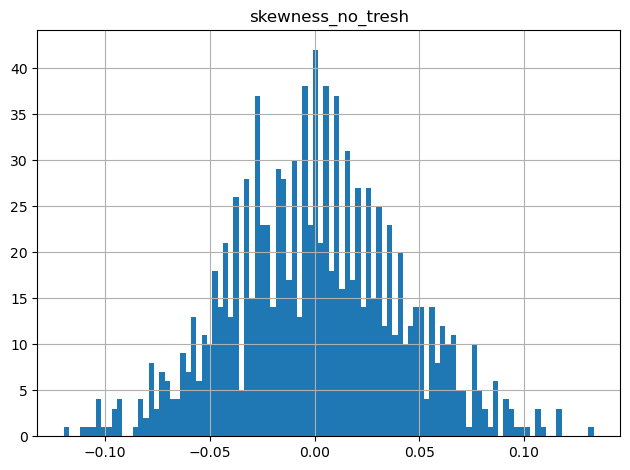

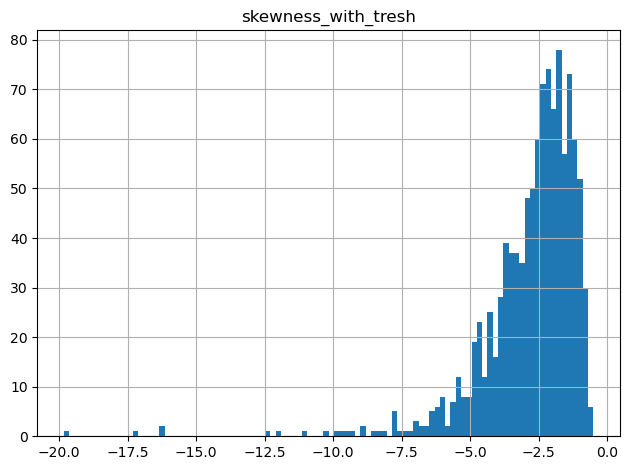

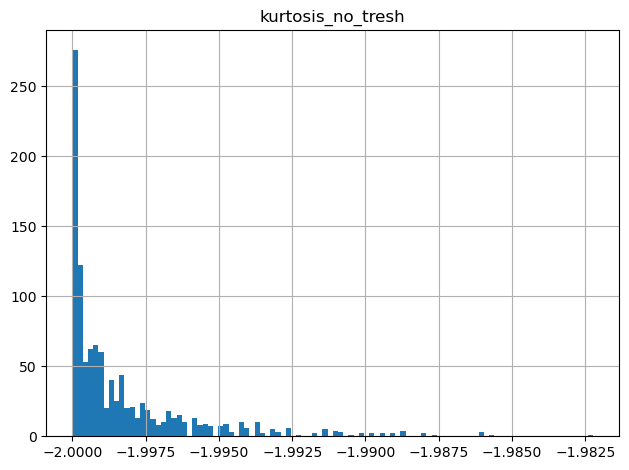

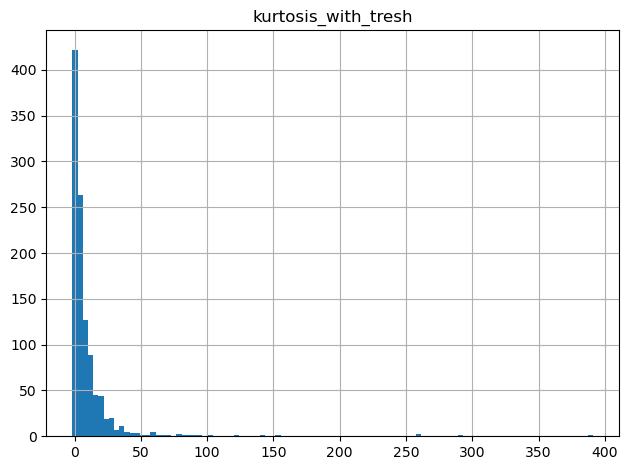

In [191]:
data = [df_rest1["skewness_no_tresh"],
df_rest1["skewness_with_tresh"],
df_rest1["kurtosis_no_tresh"],
df_rest1["kurtosis_with_tresh"]]


titles = ['skewness_no_tresh', 'skewness_with_tresh', 'kurtosis_no_tresh', 'kurtosis_with_tresh']

num_plots = len(data)

for i in range(num_plots):
    data[i].hist(bins=100)
    plt.title(titles[i])
    plt.tight_layout()
    plt.show()

In [192]:
ls

Annotated_Data.xlsx             dataframe_image.png
data_names_switchs.txt          more_data_statistic_sumary.txt
data_statistic_sumary.txt       relacao.ipynb


In [193]:
BD=pd.read_excel('Annotated_Data.xlsx')

In [194]:
BD

,Subject,Release,Acquisition,Gender,Age,3T_Full_MR_Compl,T1_Count,T2_Count,3T_RS-fMRI_Count,3T_RS-fMRI_PctCompl,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final
0,100004,S900,Q06,M,22-25,False,0,0,0,0.0,...,5.2,101.12,86.45,2.0,45.9,107.17,105.31,1.80,0.0,1.80
1,100206,S900,Q11,M,26-30,True,1,1,4,100.0,...,6.0,108.79,97.19,1.0,49.7,72.63,72.03,1.84,0.0,1.84
2,100307,Q1,Q01,F,26-30,True,1,1,4,100.0,...,3.6,101.12,86.45,0.0,38.6,71.69,71.76,1.76,0.0,1.76
3,100408,Q3,Q03,M,31-35,True,1,1,4,100.0,...,2.0,108.79,98.04,2.0,52.6,114.01,113.59,1.76,2.0,1.68
4,100610,S900,Q08,M,26-30,True,2,1,4,100.0,...,2.0,122.25,110.45,0.0,38.6,84.84,85.31,1.92,1.0,1.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1201,992774,Q2,Q02,M,31-35,True,2,2,4,100.0,...,8.4,122.25,111.41,4.0,50.1,107.17,103.55,1.76,0.0,1.76
1202,993675,S900,Q09,F,26-30,True,2,2,4,100.0,...,0.4,122.25,110.45,0.0,38.6,84.07,84.25,1.80,1.0,1.76
1203,994273,S500,Q06,M,26-30,True,1,1,4,100.0,...,6.0,122.25,111.41,7.0,63.8,110.65,109.73,1.80,1.0,1.76
1204,995174,S1200,Q13,M,22-25,False,1,1,2,0.0,...,3.6,88.61,64.58,3.0,50.1,117.16,117.40,1.80,0.0,1.80


In [217]:
# Convert Subject column in both dataframes to the same data type (string)
df_rest1['Subject'] = df_rest1['Subject'].astype(str)
BD['Subject'] = BD['Subject'].astype(str)

# Merge the dataframes on the Subject column, keeping only the rows that exist in df_rest1
merged_df_rest1 = pd.merge(df_rest1, BD, on='Subject', how='inner')

In [230]:
merged_df_rest1

,Subject,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh,Release,Acquisition,Gender,Age,3T_Full_MR_Compl,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final
0,128935,-0.033675,-3.863154,-1.998866,12.923957,S900,Q09,M,31-35,True,...,4.4,108.79,98.04,1.0,43.8,69.25,66.84,1.92,2.0,1.84
1,190031,-0.005051,-0.824955,-1.999974,-1.319449,Q3,Q03,F,26-30,True,...,5.2,122.25,110.45,0.0,38.6,103.37,102.15,1.76,0.0,1.76
2,116423,-0.015152,-1.599513,-1.999770,0.558442,S1200,Q09,M,26-30,False,...,3.6,101.12,86.45,6.0,58.5,99.67,100.24,1.84,0.0,1.84
3,849264,-0.052206,-1.278885,-1.997274,-0.364452,S900,Q10,F,31-35,True,...,6.0,108.79,98.04,0.0,38.6,76.41,73.80,1.92,0.0,1.92
4,784565,-0.043782,-0.791161,-1.998083,-1.374065,S500,Q06,F,26-30,True,...,2.8,122.25,110.45,0.0,38.6,101.63,101.22,1.84,0.0,1.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1079,249947,0.008418,-3.730168,-1.999929,11.914151,Q1,Q01,F,31-35,False,...,4.4,122.25,111.41,1.0,51.1,119.77,118.98,1.72,0.0,1.72
1080,571548,0.018519,-16.155612,-1.999657,259.003802,Q3,Q04,M,26-30,False,...,9.2,108.79,97.19,8.0,75.3,98.31,99.06,1.76,0.0,1.76
1081,192136,0.003367,-2.068173,-1.999989,2.277338,S900,Q11,M,22-25,True,...,5.2,108.79,97.19,1.0,49.7,75.95,74.32,1.80,0.0,1.80
1082,175035,-0.028622,-0.985267,-1.999181,-1.029249,S500,Q05,M,22-25,True,...,7.6,96.87,77.12,0.0,38.6,126.51,128.53,1.80,2.0,1.72


In [198]:
print(merged_df_rest1.columns[0:30])

Index(['Subject', 'skewness_no_tresh', 'skewness_with_tresh',
       'kurtosis_no_tresh', 'kurtosis_with_tresh', 'Release', 'Acquisition',
       'Gender', 'Age', '3T_Full_MR_Compl', 'T1_Count', 'T2_Count',
       '3T_RS-fMRI_Count', '3T_RS-fMRI_PctCompl', '3T_Full_Task_fMRI',
       '3T_tMRI_PctCompl', 'fMRI_WM_PctCompl', 'fMRI_Gamb_PctCompl',
       'fMRI_Mot_PctCompl', 'fMRI_Lang_PctCompl', 'fMRI_Soc_PctCompl',
       'fMRI_Rel_PctCompl', 'fMRI_Emo_PctCompl', '3T_dMRI_Compl',
       '3T_dMRI_PctCompl', 'dMRI_3T_ReconVrs', 'fMRI_3T_ReconVrs',
       '7T_Full_MR_Compl', '7T_RS-fMRI_Count', '7T_RS-fMRI_PctCompl'],
      dtype='object')


In [199]:
merged_df_rest1.columns[88:140]

Index(['MEGsession_Label', 'Alpha_Peak', 'Beta_Peak', 'MMSE_Score',
       'PSQI_Score', 'PSQI_Comp1', 'PSQI_Comp2', 'PSQI_Comp3', 'PSQI_Comp4',
       'PSQI_Comp5', 'PSQI_Comp6', 'PSQI_Comp7', 'PSQI_BedTime',
       'PSQI_Min2Asleep', 'PSQI_GetUpTime', 'PSQI_AmtSleep',
       'PSQI_Latency30Min', 'PSQI_WakeUp', 'PSQI_Bathroom', 'PSQI_Breathe',
       'PSQI_Snore', 'PSQI_TooCold', 'PSQI_TooHot', 'PSQI_BadDream',
       'PSQI_Pain', 'PSQI_Other', 'PSQI_Quality', 'PSQI_SleepMeds',
       'PSQI_DayStayAwake', 'PSQI_DayEnthusiasm', 'PSQI_BedPtnrRmate',
       'PicSeq_Unadj', 'PicSeq_AgeAdj', 'CardSort_Unadj', 'CardSort_AgeAdj',
       'Flanker_Unadj', 'Flanker_AgeAdj', 'PMAT24_A_CR', 'PMAT24_A_SI',
       'PMAT24_A_RTCR', 'ReadEng_Unadj', 'ReadEng_AgeAdj', 'PicVocab_Unadj',
       'PicVocab_AgeAdj', 'ProcSpeed_Unadj', 'ProcSpeed_AgeAdj',
       'DDisc_SV_1mo_200', 'DDisc_SV_6mo_200', 'DDisc_SV_1yr_200',
       'DDisc_SV_3yr_200', 'DDisc_SV_5yr_200', 'DDisc_SV_10yr_200'],
      dtype='objec

In [219]:
data_statistics = ["skewness_no_tresh",
"skewness_with_tresh",
"kurtosis_no_tresh",
"kurtosis_with_tresh"]

# Separate by gender
df_male = merged_df_rest1[merged_df_rest1['Gender'] == 'M']
df_female = merged_df_rest1[merged_df_rest1['Gender'] == 'F']

# Calculate summary statistics
summary_stats_male = df_male.describe()
summary_stats_female = df_female.describe()

for n in range(len(data_statistics)):
    t_stat, p_value = stats.ttest_ind(df_male[data_statistics[n]], df_female[data_statistics[n]], nan_policy='omit')
    print("Summary statistics for males:")
    print(summary_stats_male)
    print("\nSummary statistics for females:")
    print(summary_stats_female)
    print("\nT-test results:")
    print(f"T-statistic: {t_stat}, P-value: {p_value}")


Summary statistics for males:
       skewness_no_tresh  skewness_with_tresh  kurtosis_no_tresh  \
count         497.000000           497.000000         497.000000   
mean            0.000189            -2.416120          -1.998270   
std             0.041630             1.477049           0.002356   
min            -0.119743           -16.155612          -2.000000   
25%            -0.026938            -2.985517          -1.999819   
50%             0.000000            -2.103722          -1.999181   
75%             0.028622            -1.402227          -1.997615   
max             0.109592            -0.561282          -1.985662   

       kurtosis_with_tresh    T1_Count    T2_Count  3T_RS-fMRI_Count  \
count           497.000000  497.000000  497.000000        497.000000   
mean              6.014920    1.609658    1.498994          3.903421   
std              15.090524    0.488318    0.500503          0.424464   
min              -1.684963    1.000000    1.000000          2.000000 

In [201]:
merged_df_rest1

,Subject,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh,Release,Acquisition,Gender,Age,3T_Full_MR_Compl,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final


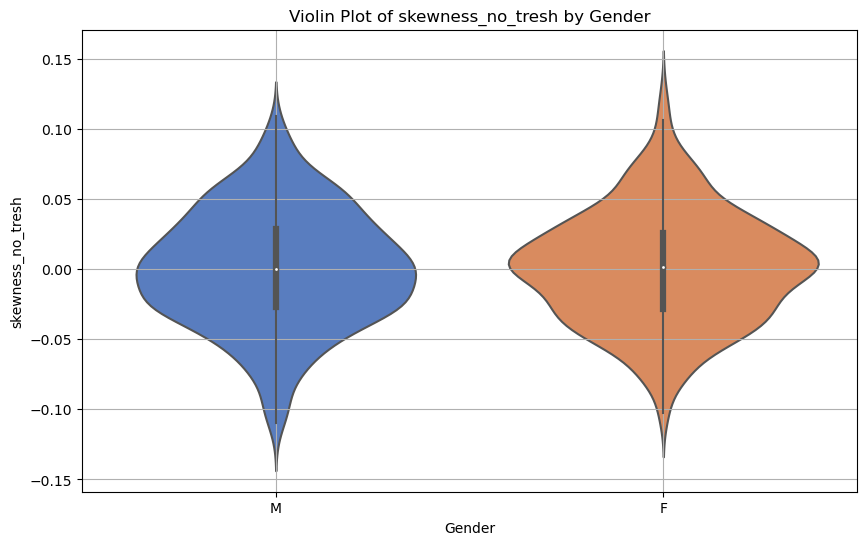

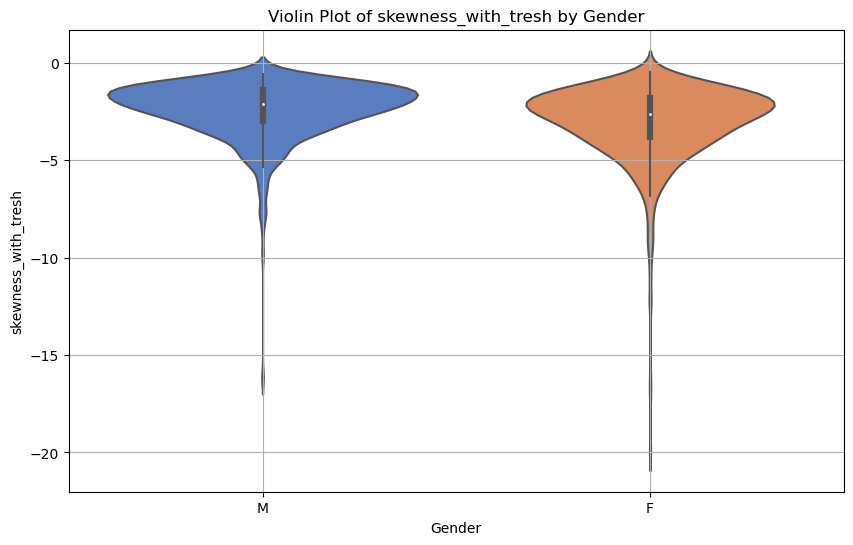

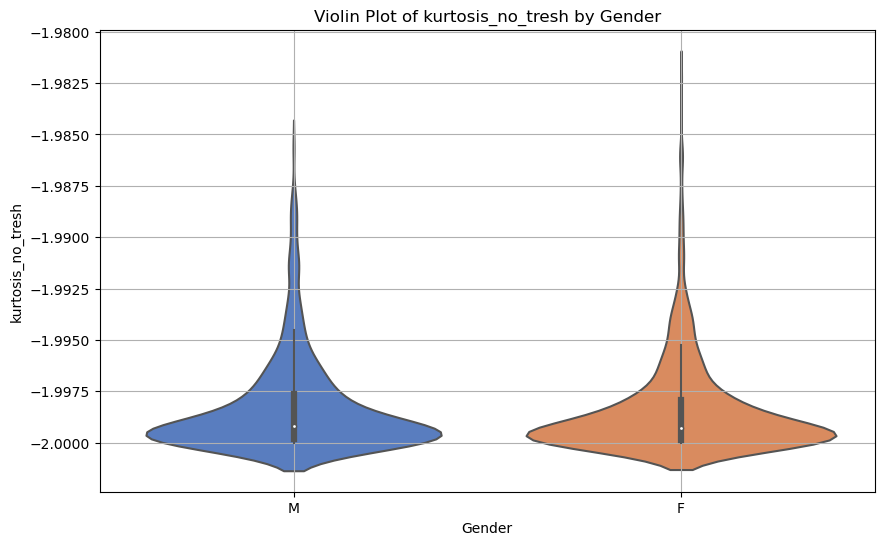

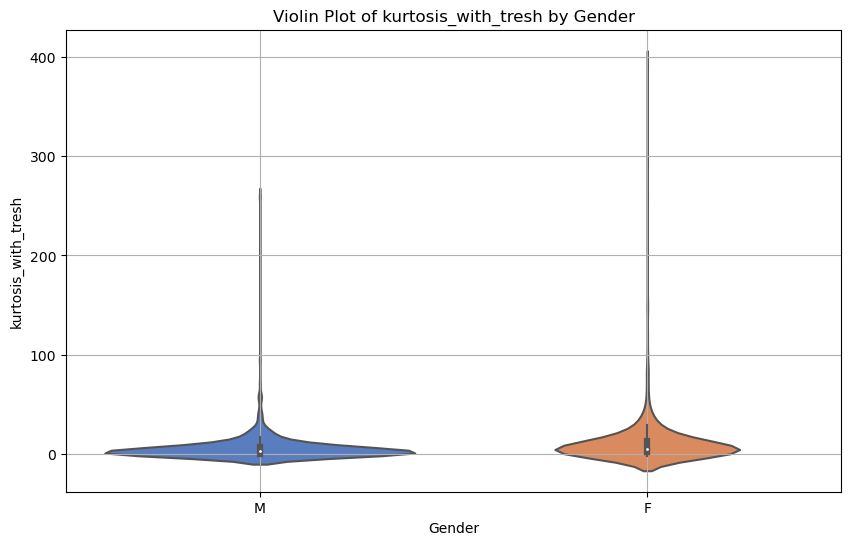

In [220]:
import seaborn as sns
data_statistics = ["skewness_no_tresh",
"skewness_with_tresh",
"kurtosis_no_tresh",
"kurtosis_with_tresh"]

# Plot violin plots side by side
for n in range(len(data_statistics)):
    plt.figure(figsize=(10, 6))
    sns.violinplot(x='Gender', y = data_statistics[n], data=merged_df_rest1, palette="muted")
    plt.title('Violin Plot of ' f'{data_statistics[n]}'' by Gender')
    plt.xlabel('Gender')
    plt.ylabel(data_statistics[n])
    plt.grid(True)
    plt.show()


In [248]:
import matplotlib.pyplot as plt
import statsmodels.api as sm

# List of columns to test
columns_to_test = [
    'MMSE_Score', 'PSQI_Score', 'PSQI_Comp1', 'PSQI_Comp2', 'PSQI_Comp3',
    'PSQI_Comp4', 'PSQI_Comp5', 'PSQI_Comp6', 'PSQI_Comp7', 'PSQI_BedTime',
    'PSQI_Min2Asleep', 'PSQI_GetUpTime', 'PSQI_AmtSleep',
    'PSQI_Latency30Min', 'PSQI_WakeUp', 'PSQI_Bathroom', 'PSQI_Breathe',
    'PSQI_Snore', 'PSQI_TooCold', 'PSQI_TooHot', 'PSQI_BadDream',
    'PSQI_Pain', 'PSQI_Other', 'PSQI_Quality', 'PSQI_SleepMeds',
    'PSQI_DayStayAwake', 'PSQI_DayEnthusiasm', 'PSQI_BedPtnrRmate',
    'PicSeq_Unadj', 'PicSeq_AgeAdj', 'CardSort_Unadj', 'CardSort_AgeAdj',
    'Flanker_Unadj', 'Flanker_AgeAdj', 'PMAT24_A_CR', 'PMAT24_A_SI',
    'PMAT24_A_RTCR', 'ReadEng_Unadj', 'ReadEng_AgeAdj', 'PicVocab_Unadj'
]

for col in columns_to_test:
    if col in merged_df_rest1.columns:
        merged_df_rest1[col] = pd.to_numeric(merged_df_rest1[col], errors='coerce')
        
data_statistics = ["skewness_no_tresh",
"skewness_with_tresh",
"kurtosis_no_tresh",
"kurtosis_with_tresh"]       
        
def p_values_plot(ind):
    for col in columns_to_test:
        if col in merged_df_rest1.columns:
            df = merged_df_rest1[[data_statistics[ind], col]].dropna()
            if not df.empty:  # Ensure there's data to plot
                x = np.linspace(0, 10, 100)
                X = sm.add_constant(df[col])
                y = df[data_statistics[ind]]
                model = sm.OLS(y, X).fit()
                p_value = model.pvalues[col]
                plt.figure()
                plt.scatter(df[col], df[data_statistics[ind]])
                plt.title(f'{data_statistics[ind]} vs {col} (p-value: {p_value:.4f})')
                plt.xlabel(col)
                plt.ylabel(data_statistics[ind])
                plt.grid(True)
                plt.show()

Start plotting  skewness_no_tresh


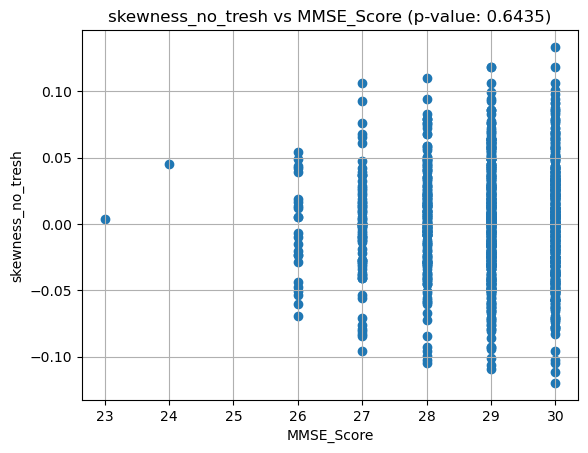

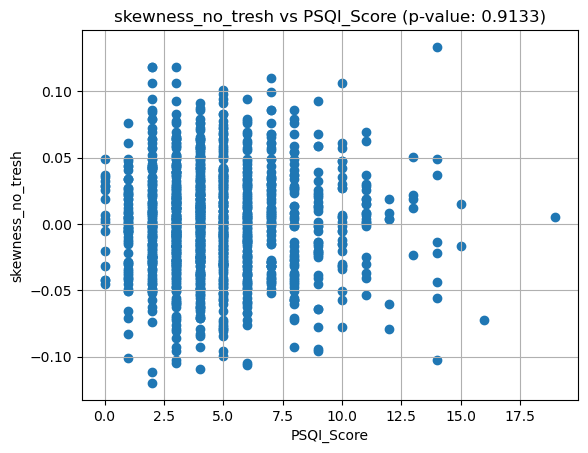

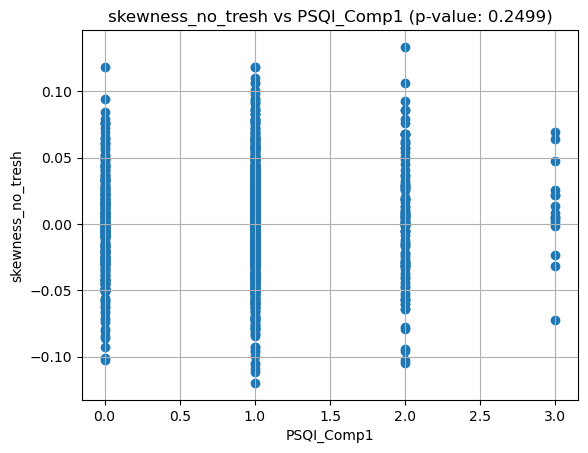

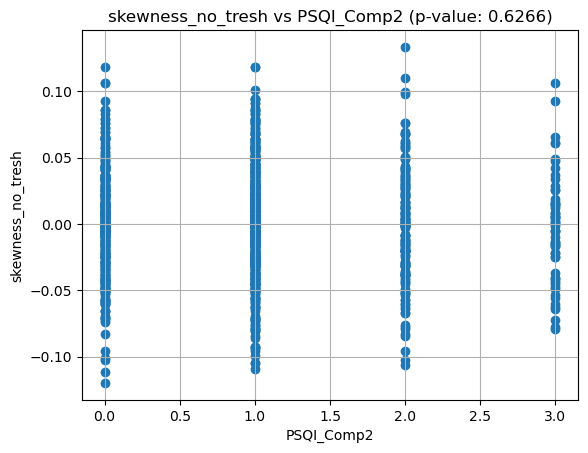

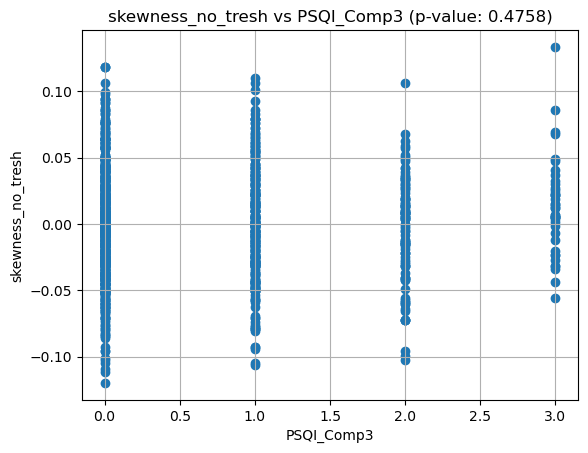

...

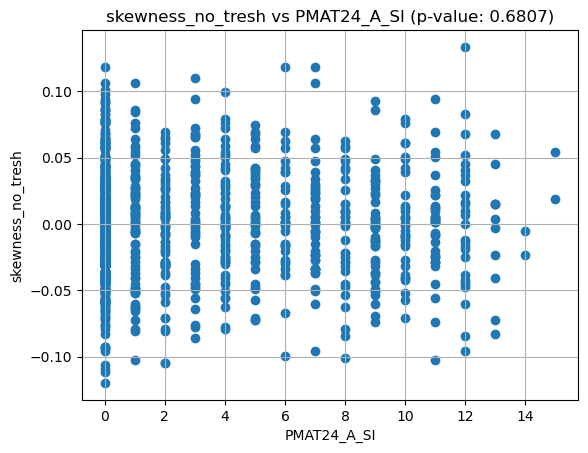

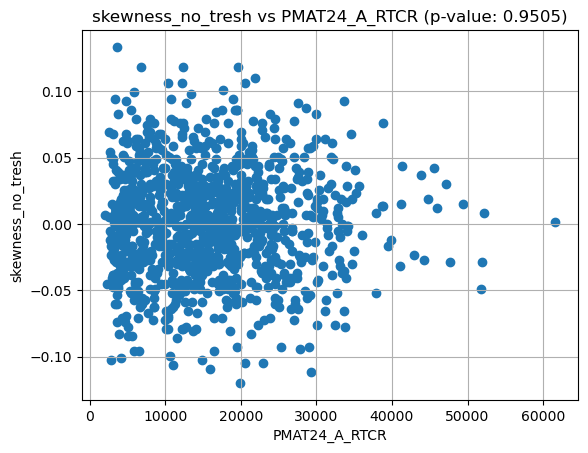

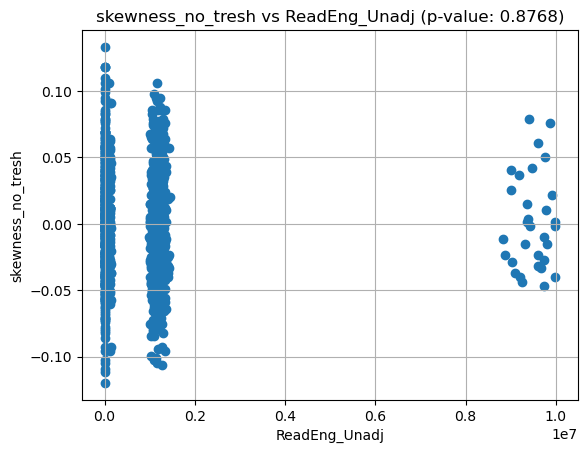

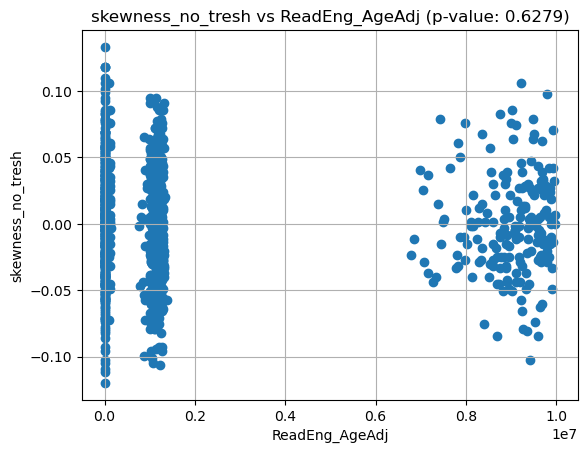

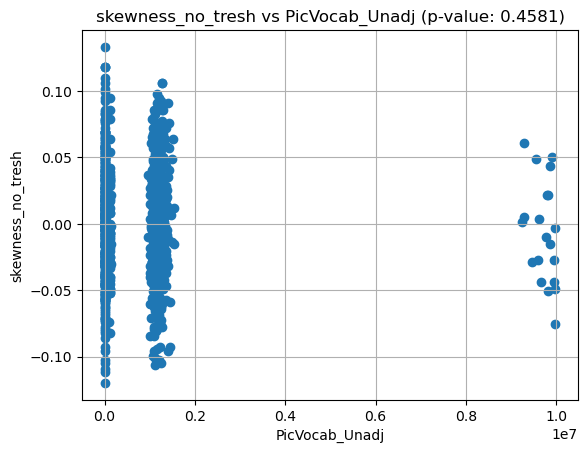

End plotting skewness_no_tresh

Start plotting  skewness_with_tresh


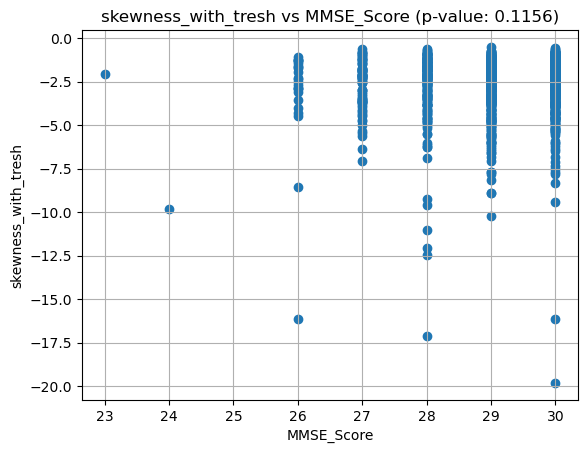

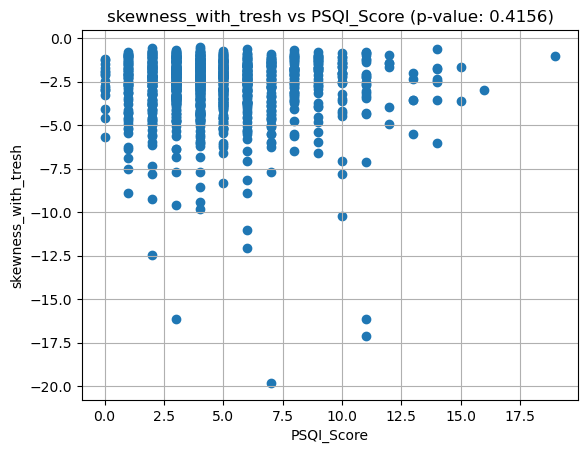

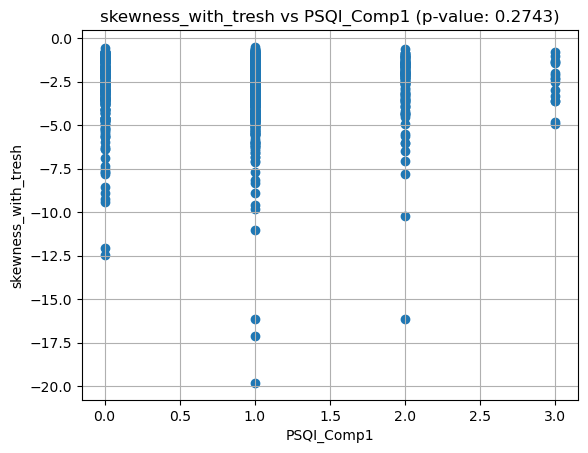

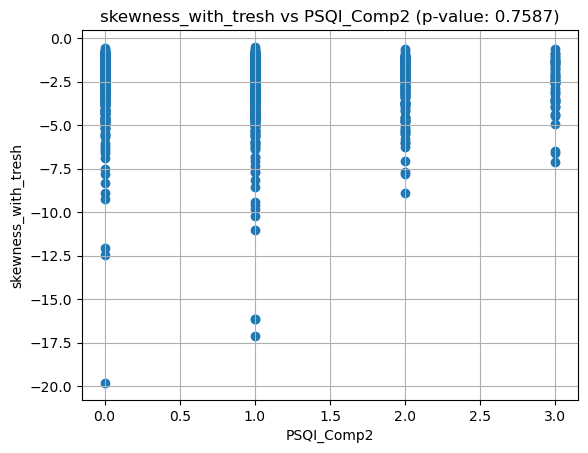

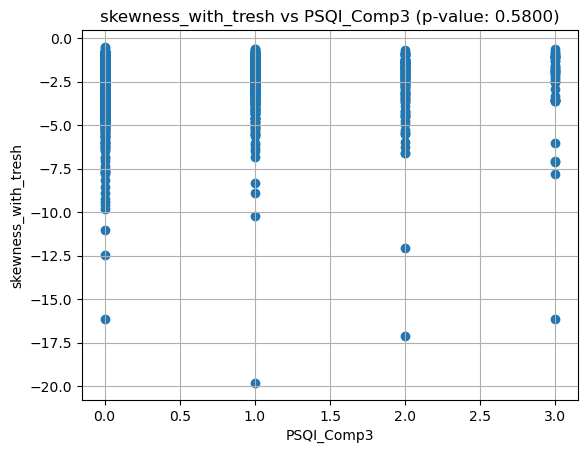

...

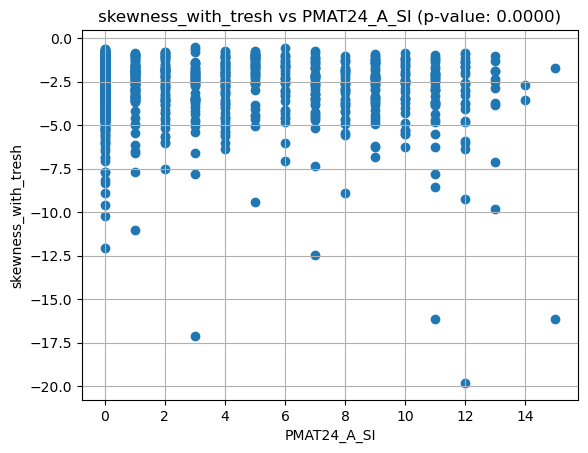

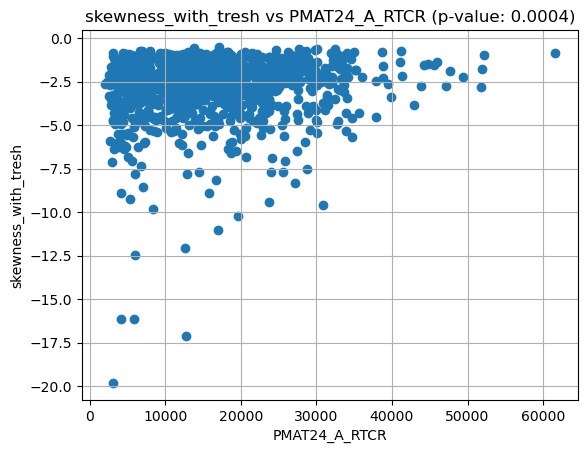

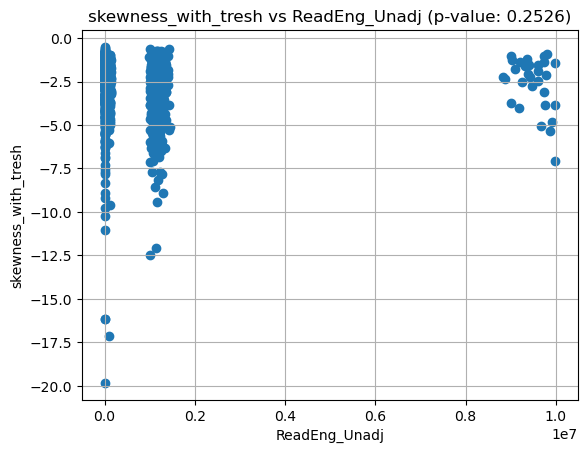

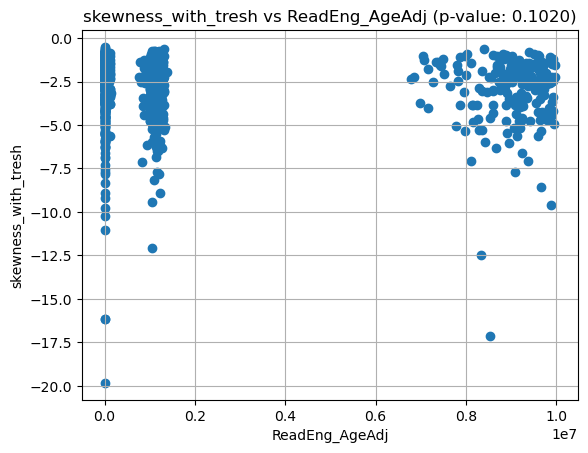

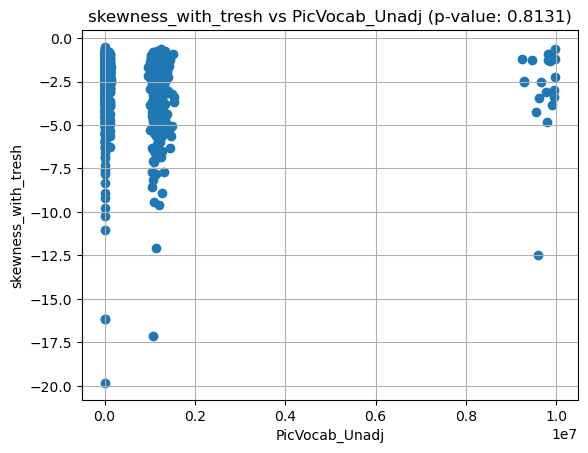

End plotting skewness_with_tresh

Start plotting  kurtosis_no_tresh


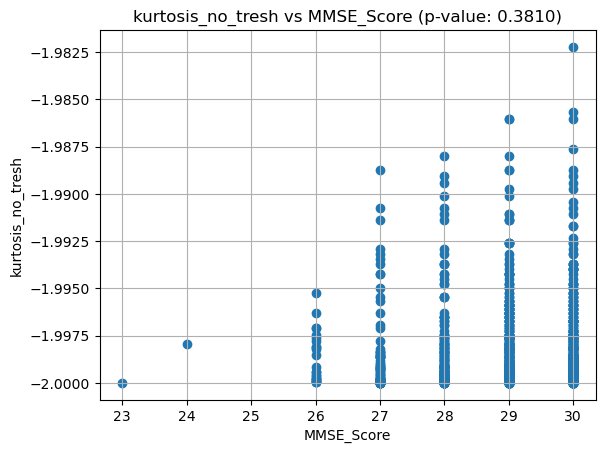

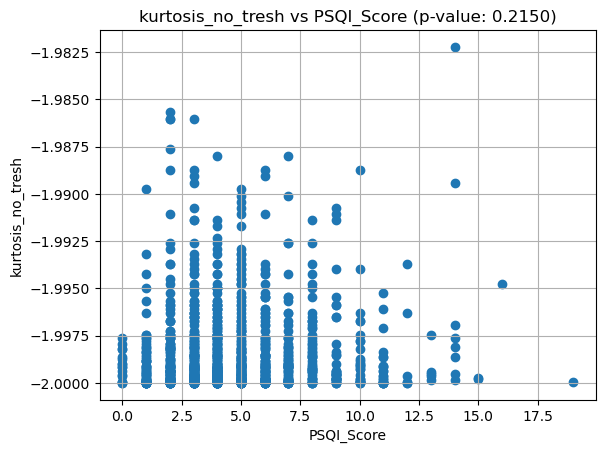

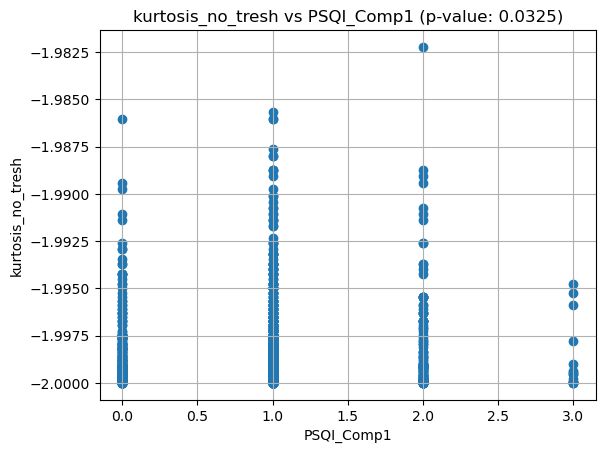

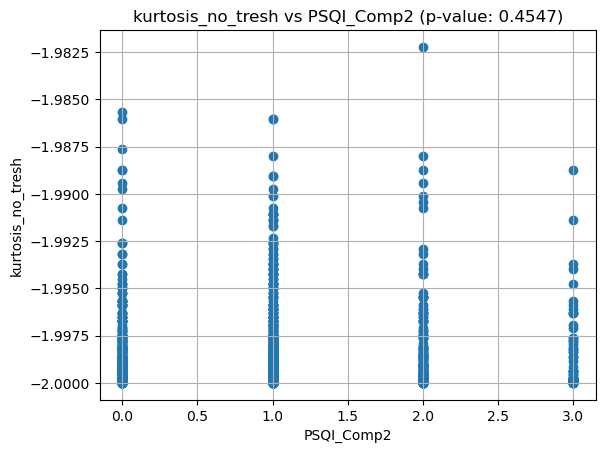

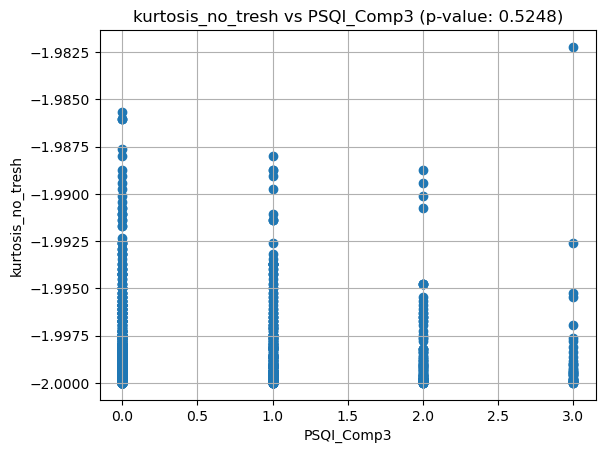

...

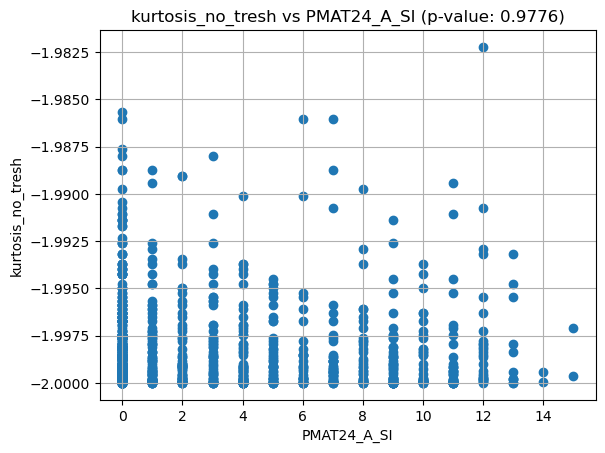

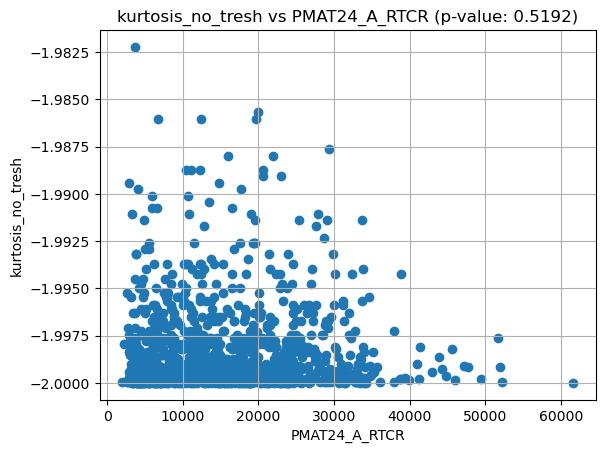

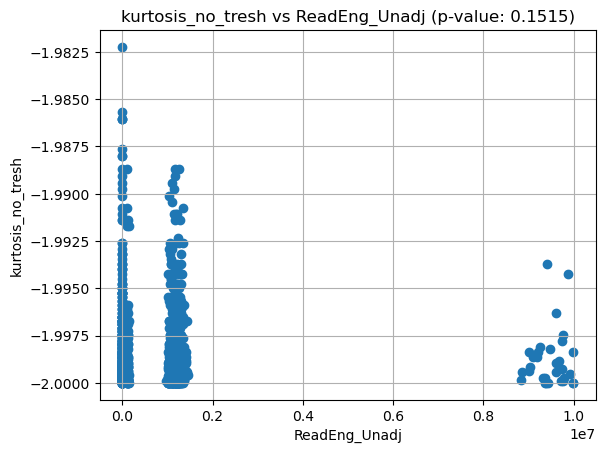

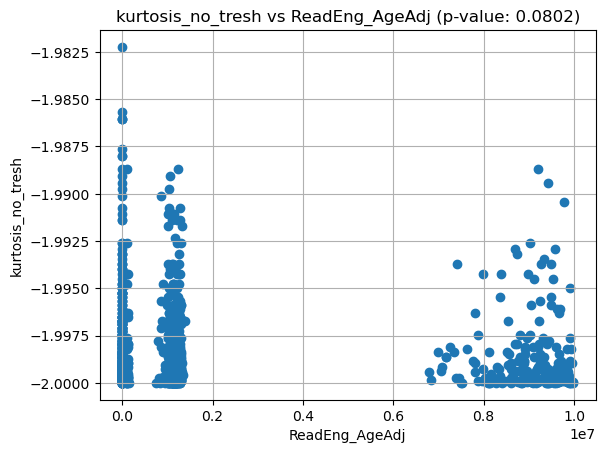

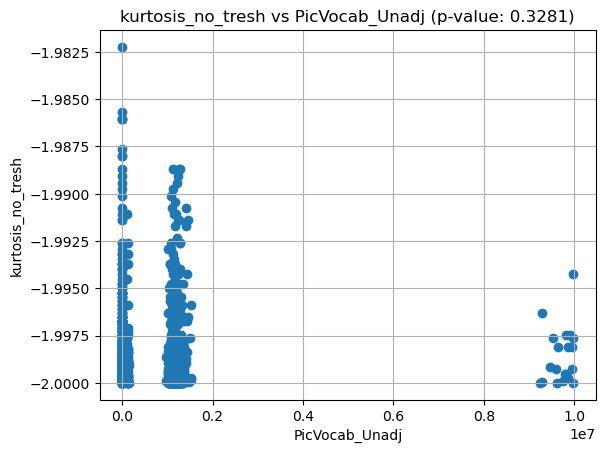

End plotting kurtosis_no_tresh

Start plotting  kurtosis_with_tresh


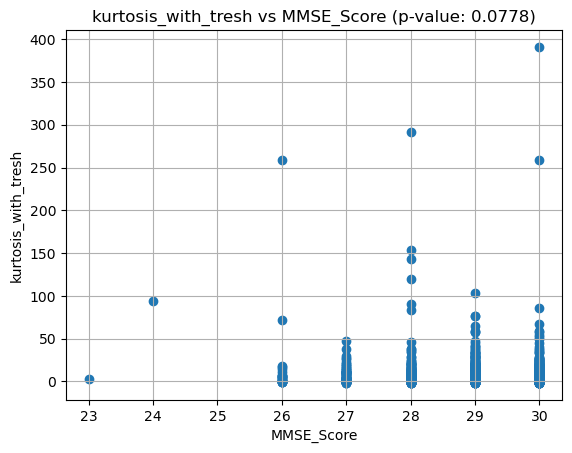

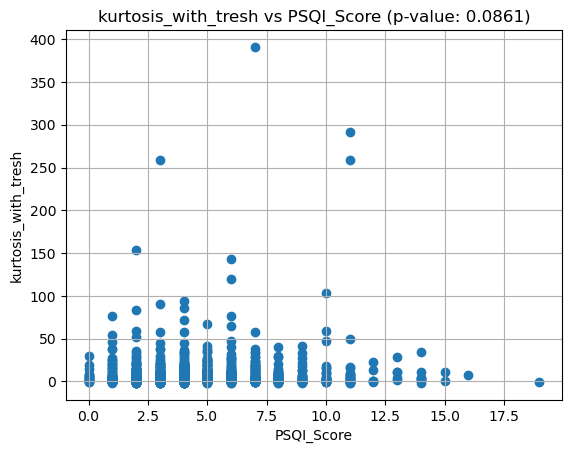

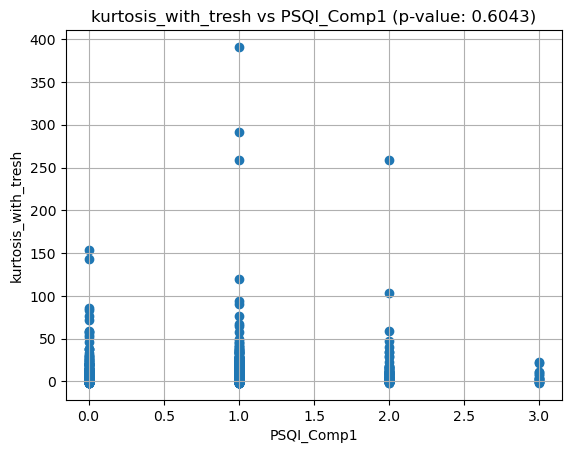

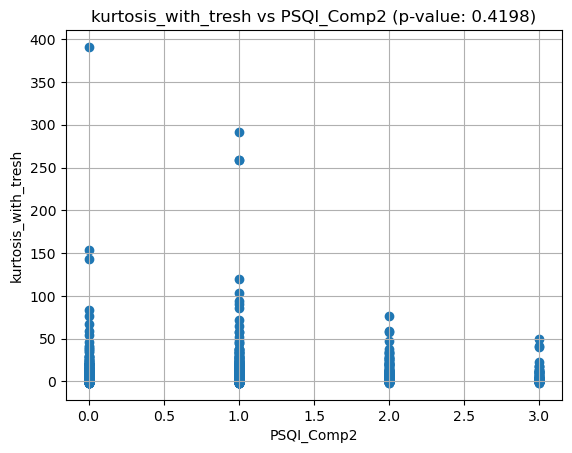

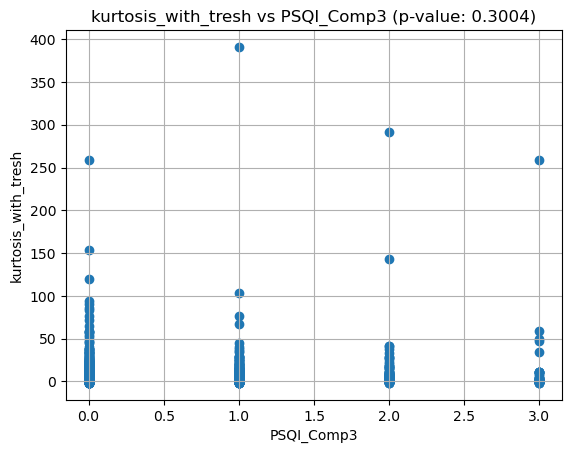

...

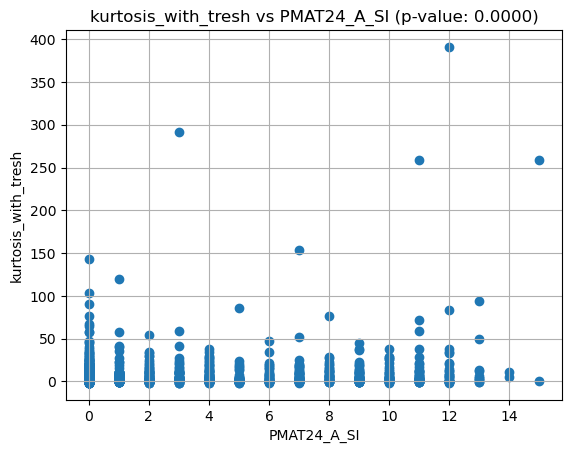

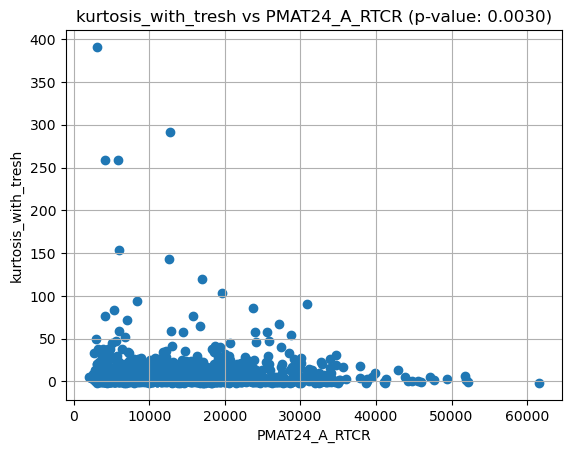

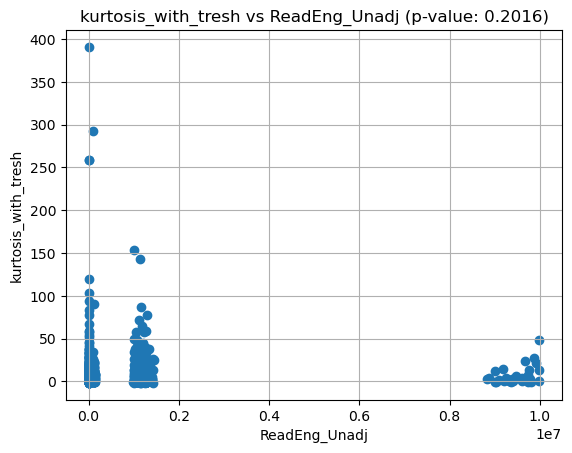

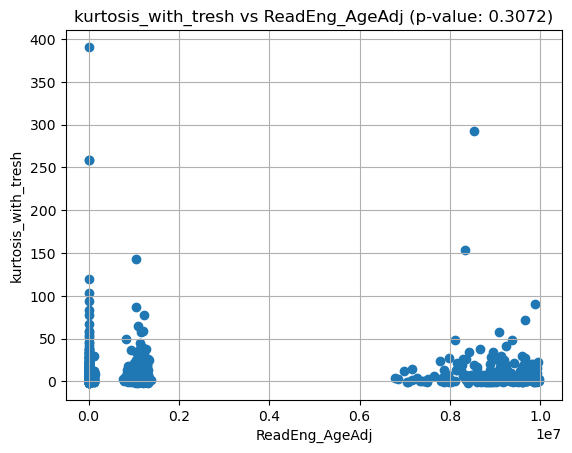

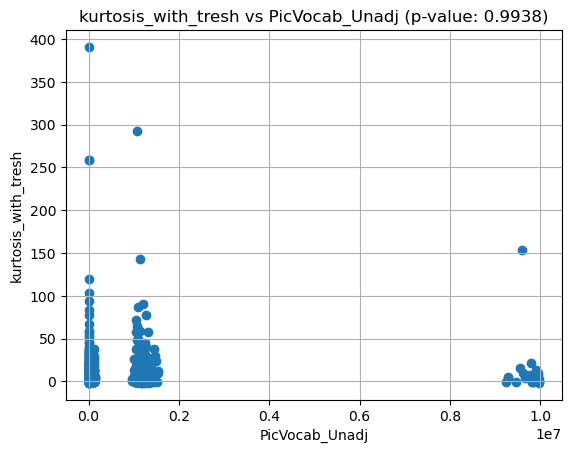

End plotting kurtosis_with_tresh



In [249]:
for n in range(len(data_statistics)):
    print(f"\033[32mStart plotting  {data_statistics[n]}\033[0m")
    p_values_plot(n)
    print(f"\033[31mEnd plotting {data_statistics[n]}\n\033[0m")

In [229]:
merged_df.columns

Index(['Subject', 'switch_no_tresh', 'switch_with_tresh', 'mean_no_tresh',
       'mean_with_tresh', 'vari_no_tresh', 'vari_with_tresh', 'devi_no_tresh',
       'devi_with_tresh', 'spear_corr_switch_tresh',
       ...
       'Noise_Comp', 'Odor_Unadj', 'Odor_AgeAdj', 'PainIntens_RawScore',
       'PainInterf_Tscore', 'Taste_Unadj', 'Taste_AgeAdj', 'Mars_Log_Score',
       'Mars_Errs', 'Mars_Final'],
      dtype='object', length=591)

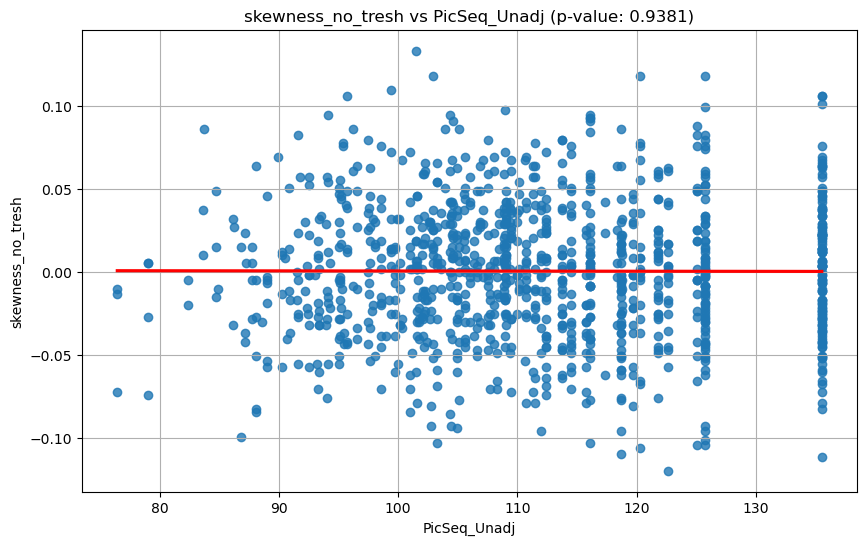

Regression summary for PicSeq_Unadj:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                  0.006038
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.938
Time:                        16:55:19   Log-Likelihood:                 1925.6
No. Observations:                1083   AIC:                            -3847.
Df Residuals:                    1081   BIC:                            -3837.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const     

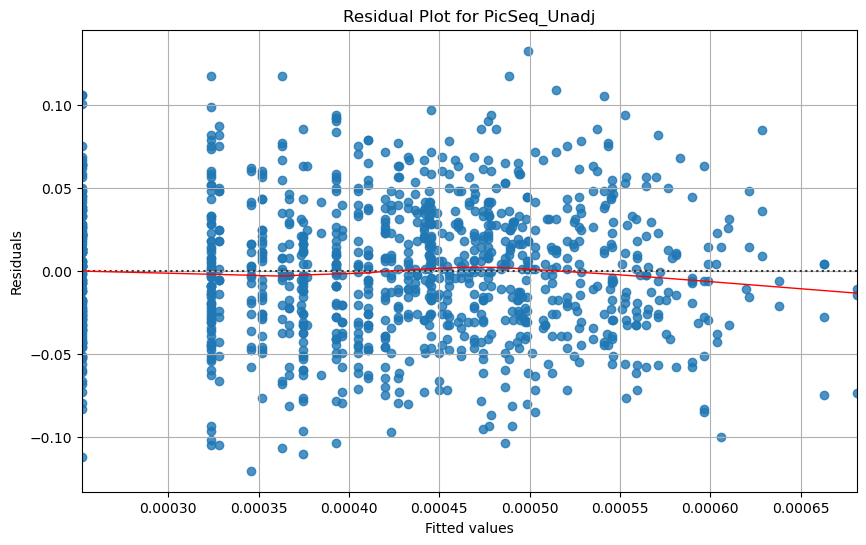

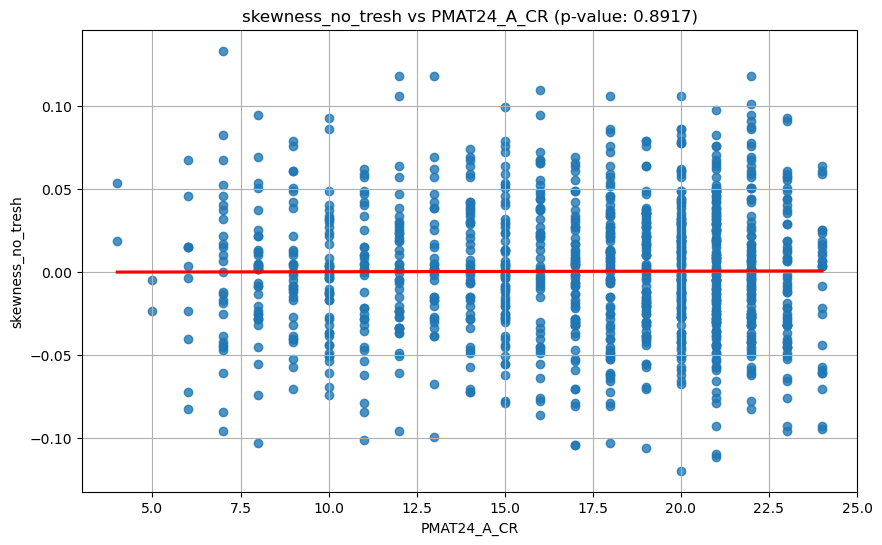

Regression summary for PMAT24_A_CR:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                   0.01854
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.892
Time:                        16:55:20   Log-Likelihood:                 1914.0
No. Observations:                1077   AIC:                            -3824.
Df Residuals:                    1075   BIC:                            -3814.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

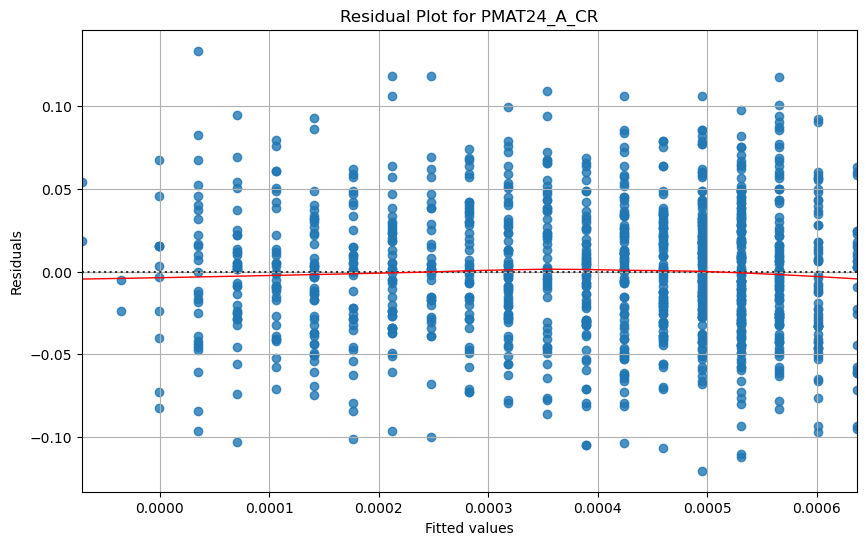

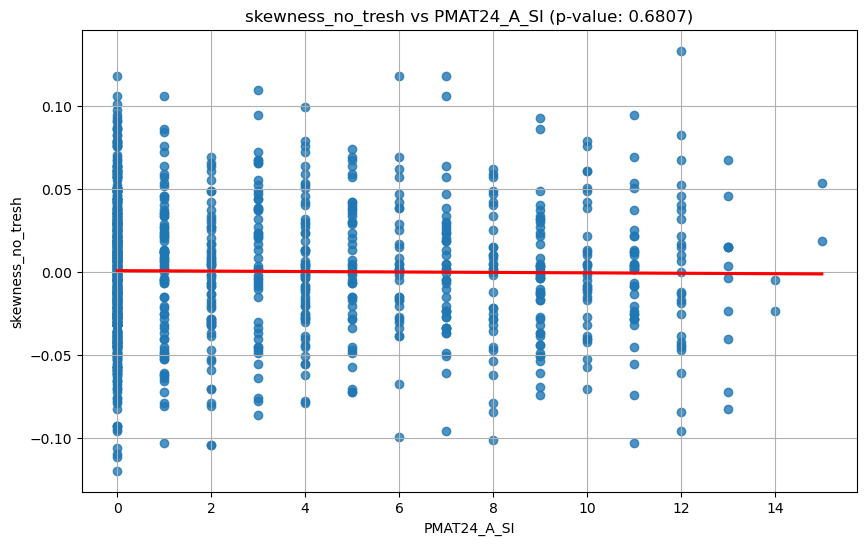

Regression summary for PMAT24_A_SI:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.1695
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.681
Time:                        16:55:20   Log-Likelihood:                 1914.1
No. Observations:                1077   AIC:                            -3824.
Df Residuals:                    1075   BIC:                            -3814.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

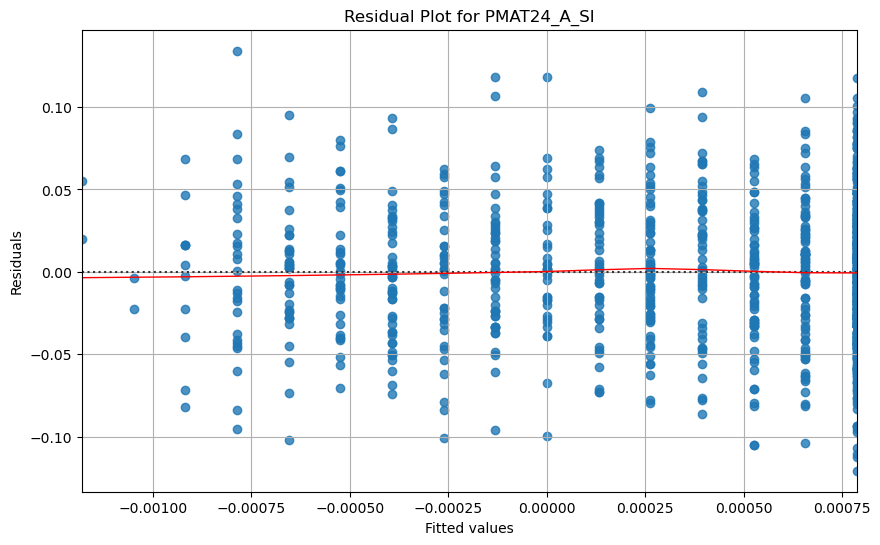

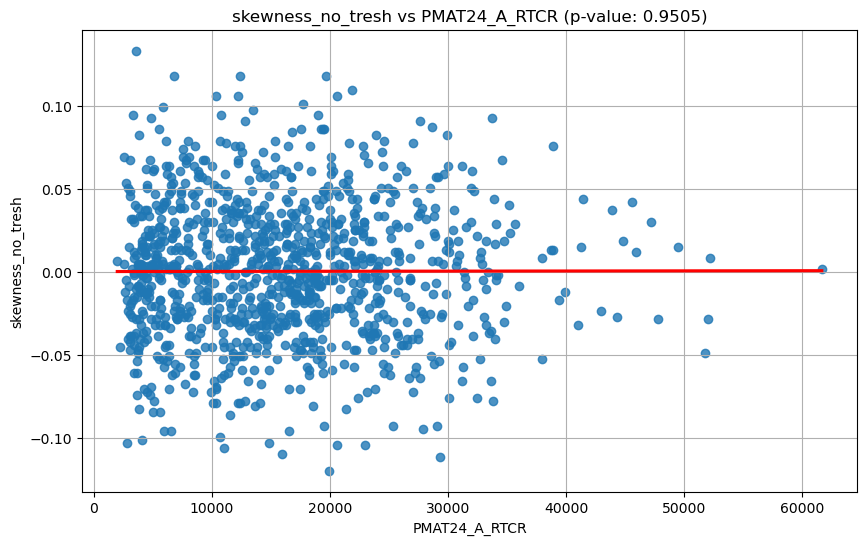

Regression summary for PMAT24_A_RTCR:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                  0.003862
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.950
Time:                        16:55:20   Log-Likelihood:                 1914.0
No. Observations:                1077   AIC:                            -3824.
Df Residuals:                    1075   BIC:                            -3814.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const  

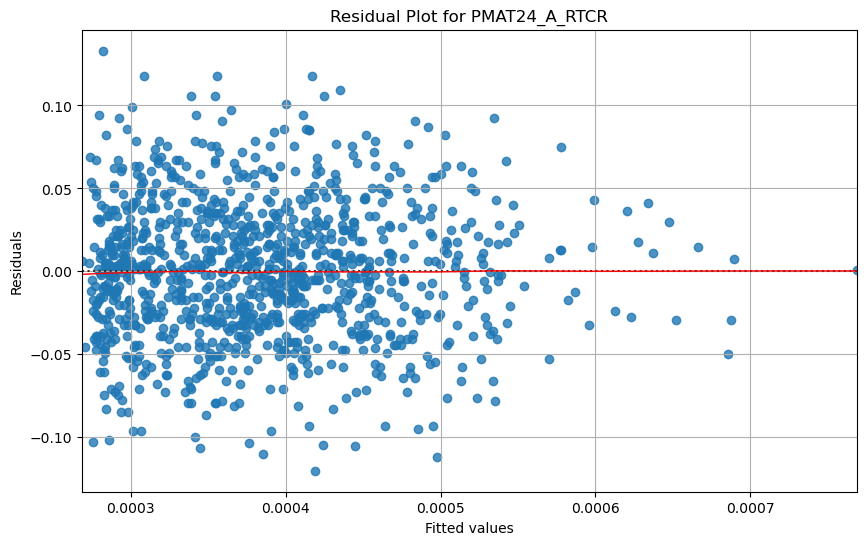

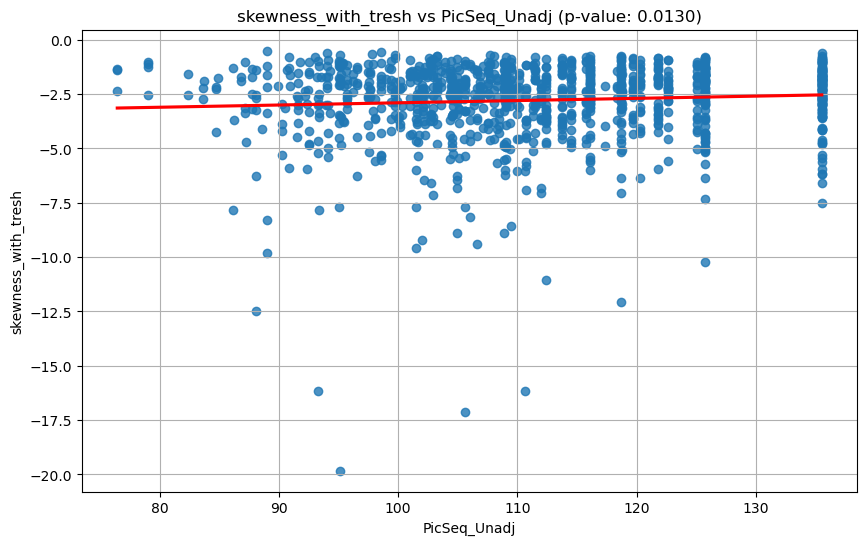

Regression summary for PicSeq_Unadj:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.006
Model:                             OLS   Adj. R-squared:                  0.005
Method:                  Least Squares   F-statistic:                     6.194
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):             0.0130
Time:                         16:55:20   Log-Likelihood:                -2173.1
No. Observations:                 1083   AIC:                             4350.
Df Residuals:                     1081   BIC:                             4360.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------


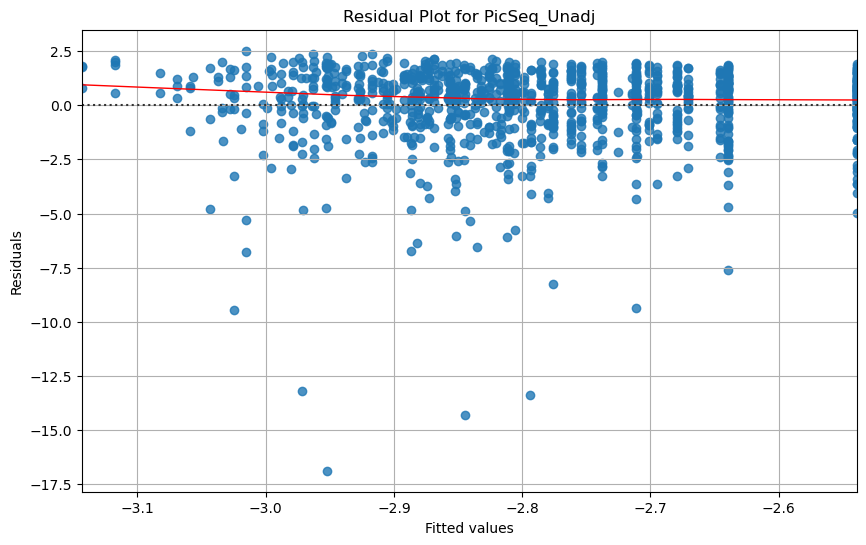

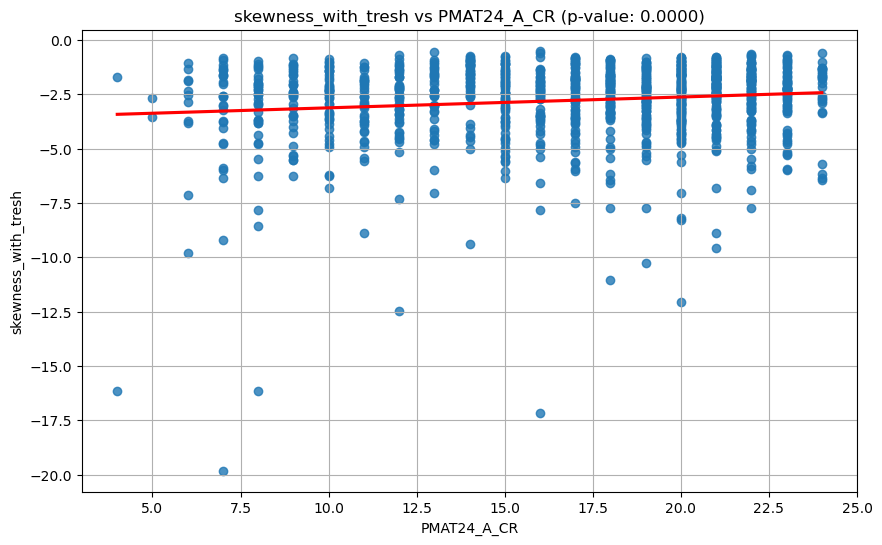

Regression summary for PMAT24_A_CR:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.017
Model:                             OLS   Adj. R-squared:                  0.017
Method:                  Least Squares   F-statistic:                     19.12
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):           1.35e-05
Time:                         16:55:20   Log-Likelihood:                -2156.6
No. Observations:                 1077   AIC:                             4317.
Df Residuals:                     1075   BIC:                             4327.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

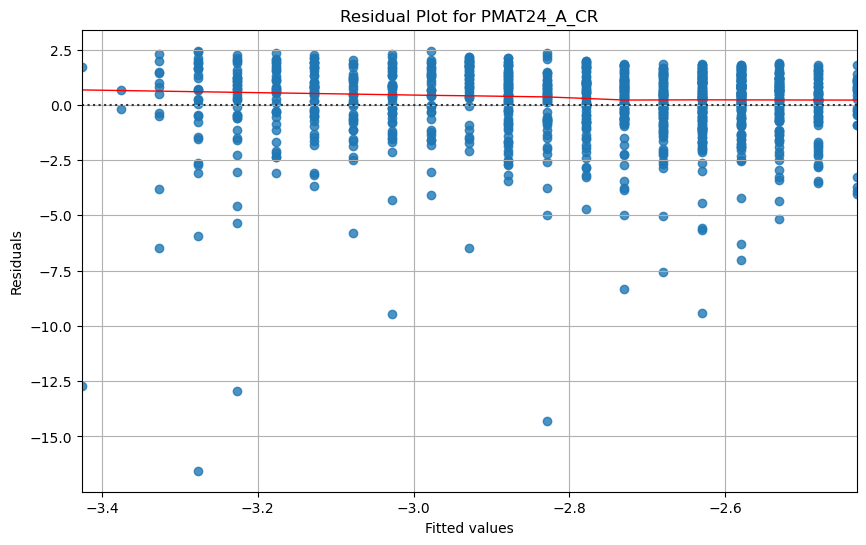

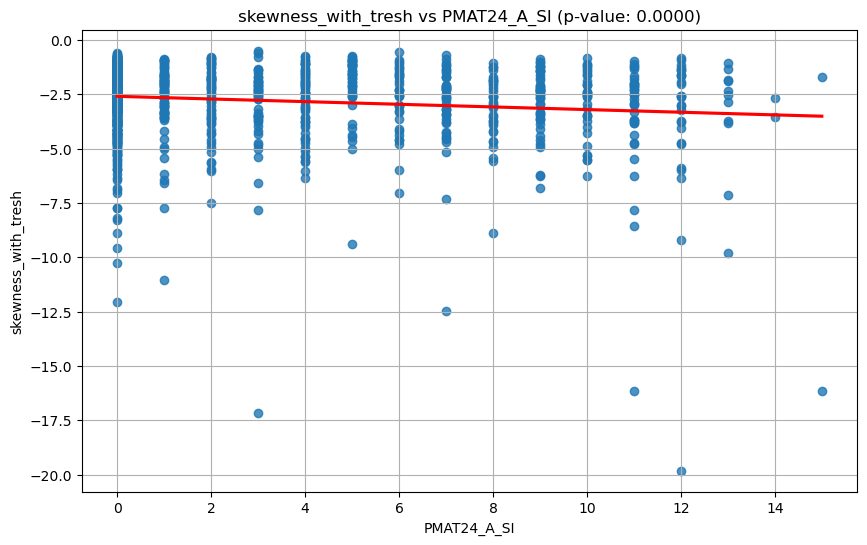

Regression summary for PMAT24_A_SI:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.017
Model:                             OLS   Adj. R-squared:                  0.017
Method:                  Least Squares   F-statistic:                     19.08
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):           1.38e-05
Time:                         16:55:21   Log-Likelihood:                -2156.6
No. Observations:                 1077   AIC:                             4317.
Df Residuals:                     1075   BIC:                             4327.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

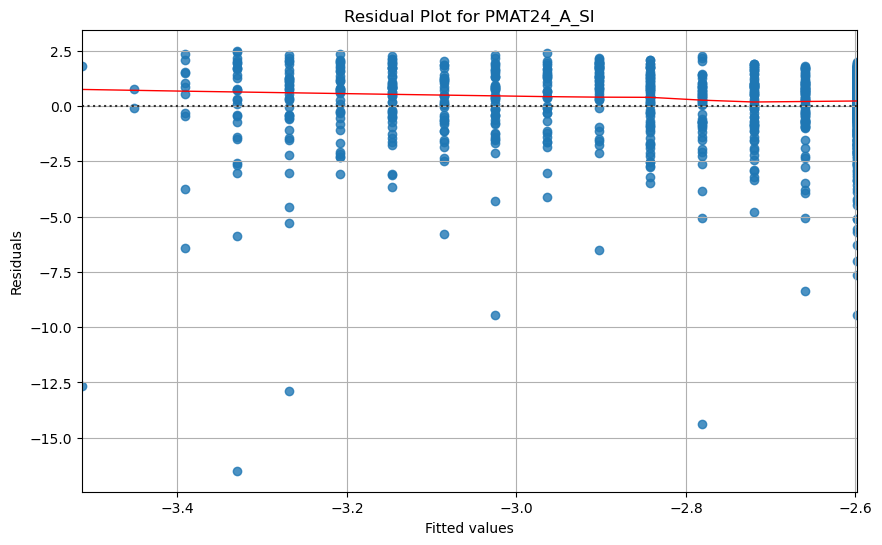

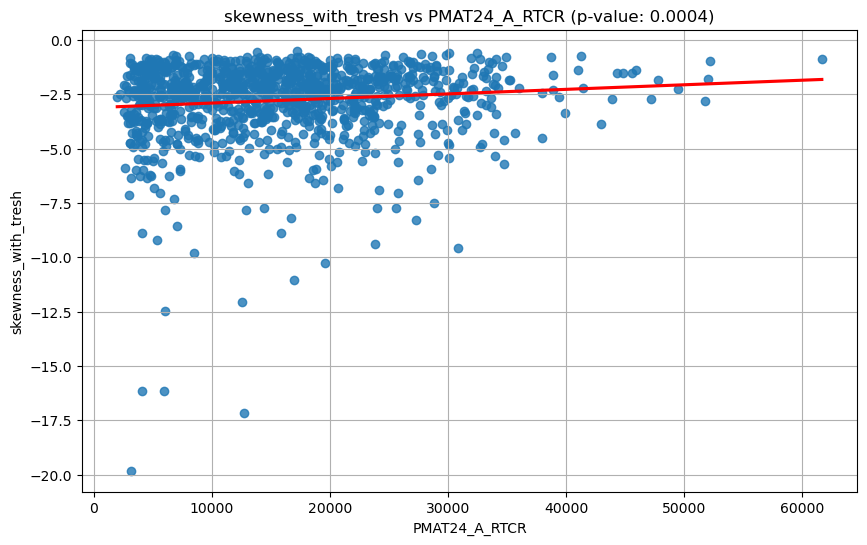

Regression summary for PMAT24_A_RTCR:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.012
Model:                             OLS   Adj. R-squared:                  0.011
Method:                  Least Squares   F-statistic:                     12.57
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):           0.000409
Time:                         16:55:21   Log-Likelihood:                -2159.8
No. Observations:                 1077   AIC:                             4324.
Df Residuals:                     1075   BIC:                             4334.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

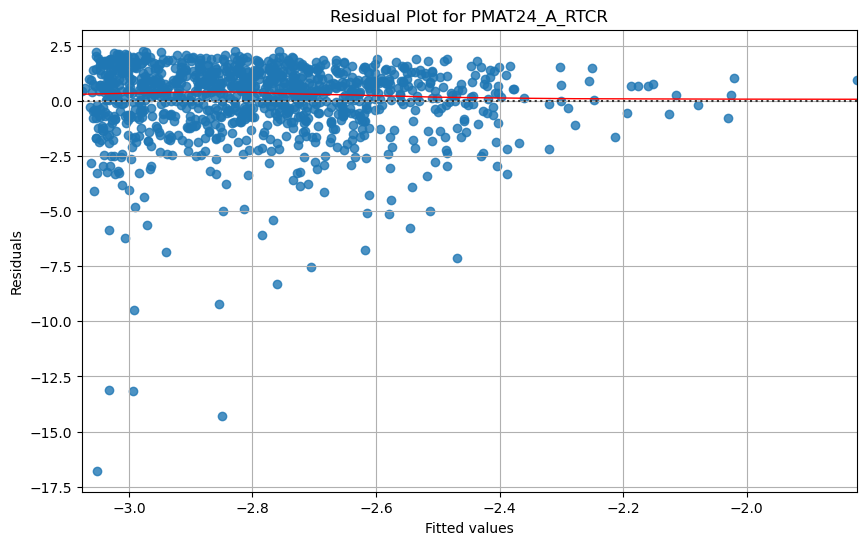

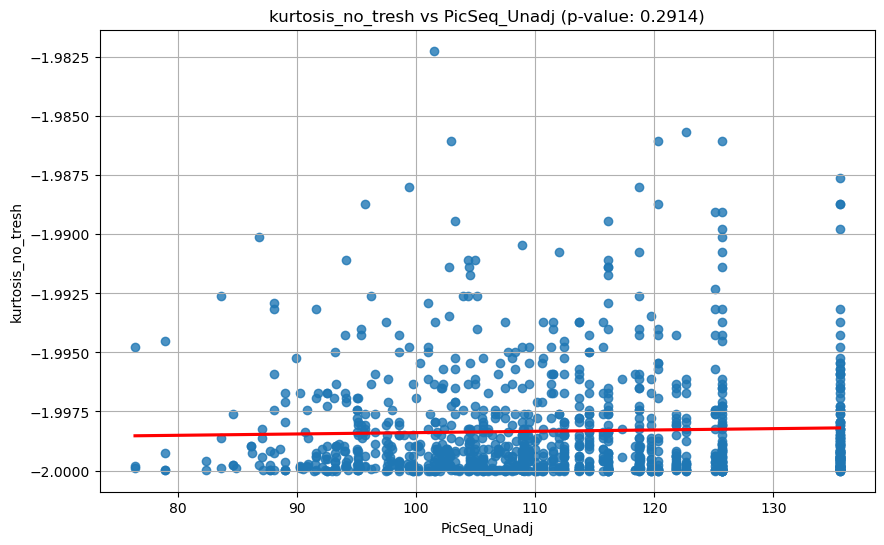

Regression summary for PicSeq_Unadj:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     1.114
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.291
Time:                        16:55:21   Log-Likelihood:                 5023.0
No. Observations:                1083   AIC:                        -1.004e+04
Df Residuals:                    1081   BIC:                        -1.003e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const     

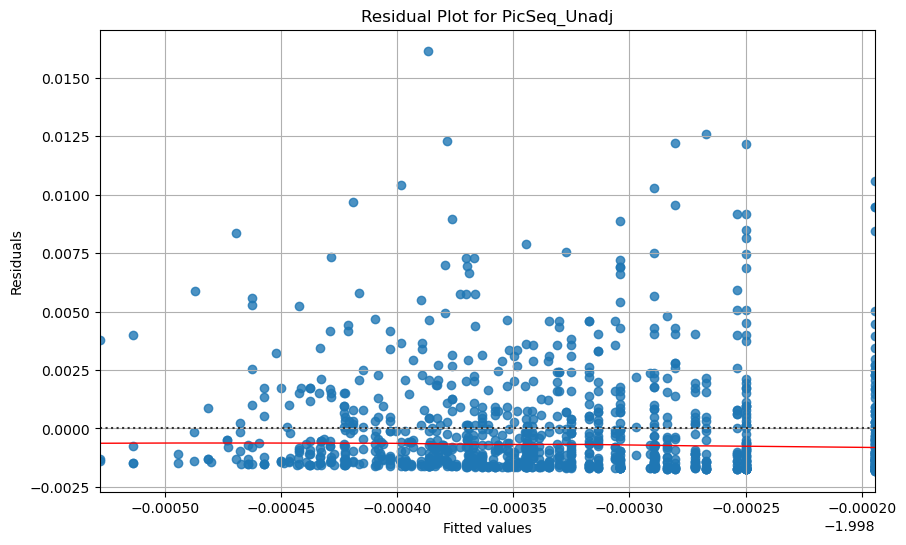

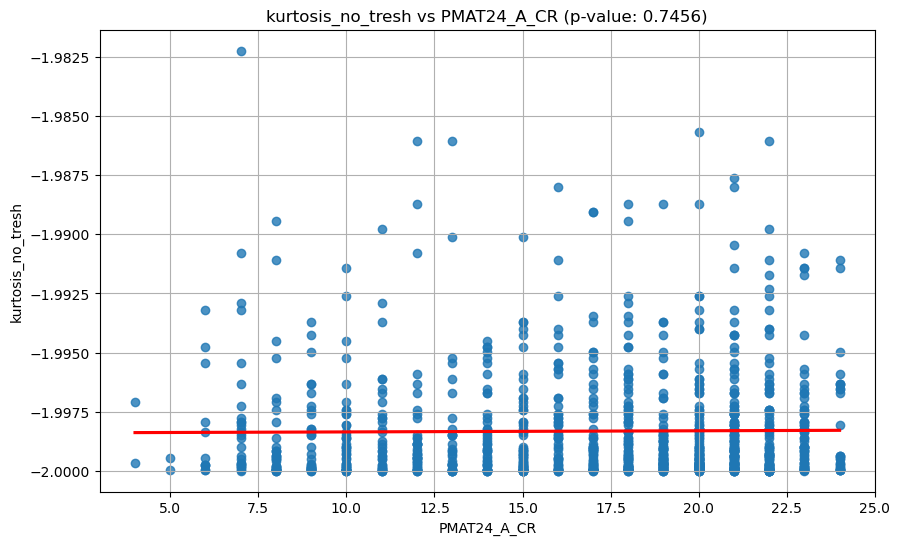

Regression summary for PMAT24_A_CR:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.1053
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.746
Time:                        16:55:21   Log-Likelihood:                 4993.9
No. Observations:                1077   AIC:                            -9984.
Df Residuals:                    1075   BIC:                            -9974.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

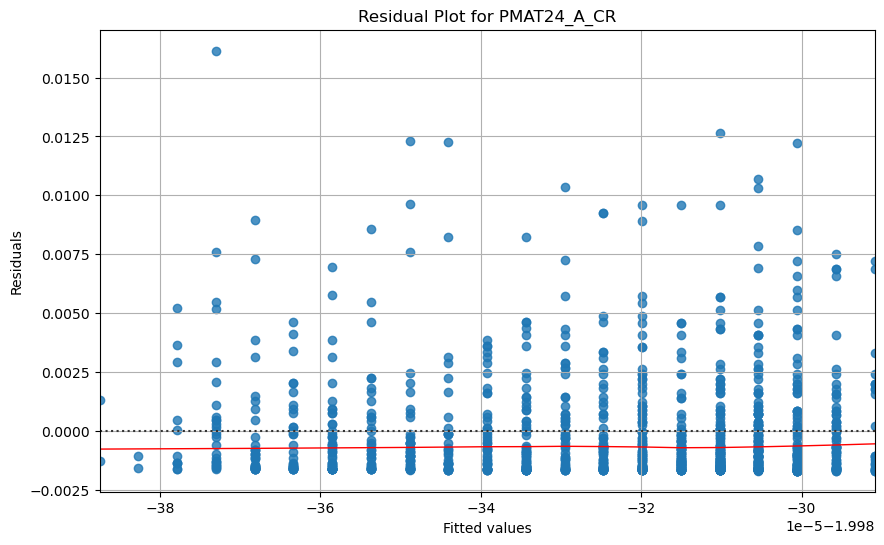

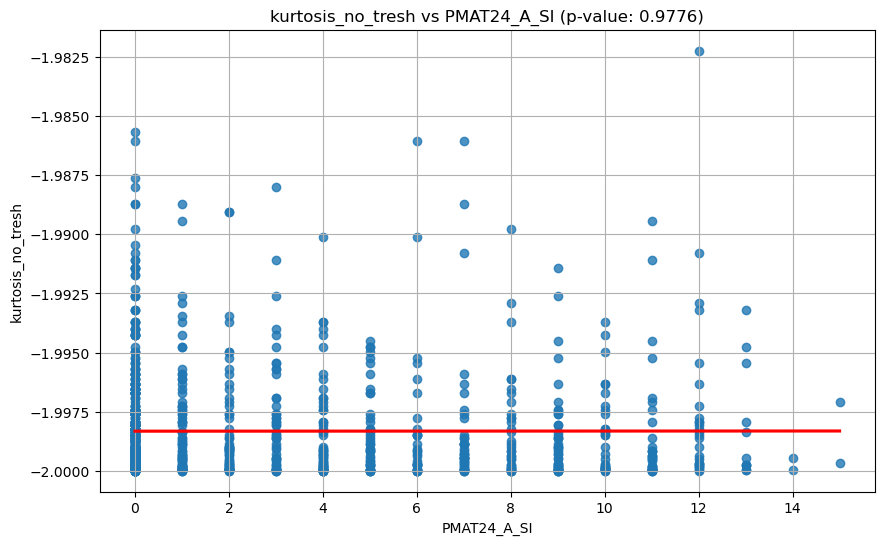

Regression summary for PMAT24_A_SI:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                 0.0007906
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.978
Time:                        16:55:21   Log-Likelihood:                 4993.8
No. Observations:                1077   AIC:                            -9984.
Df Residuals:                    1075   BIC:                            -9974.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

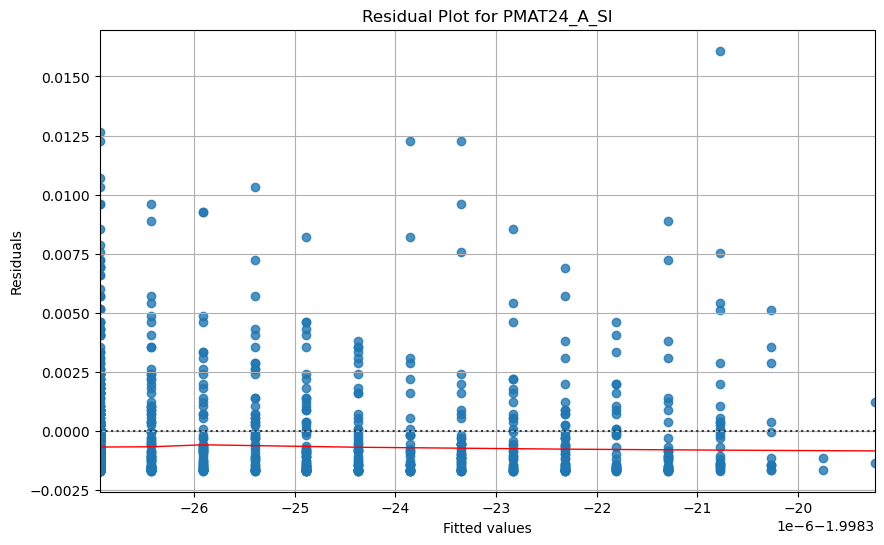

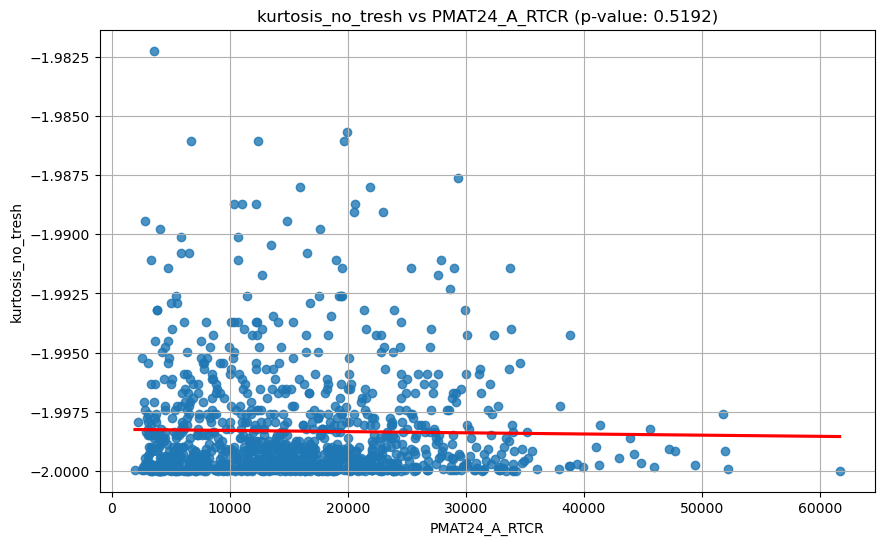

Regression summary for PMAT24_A_RTCR:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.4158
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.519
Time:                        16:55:21   Log-Likelihood:                 4994.0
No. Observations:                1077   AIC:                            -9984.
Df Residuals:                    1075   BIC:                            -9974.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const  

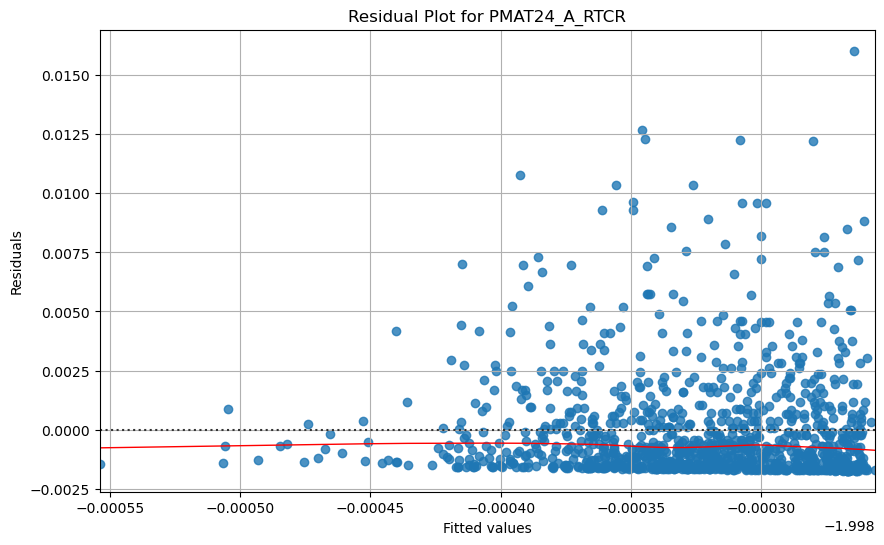

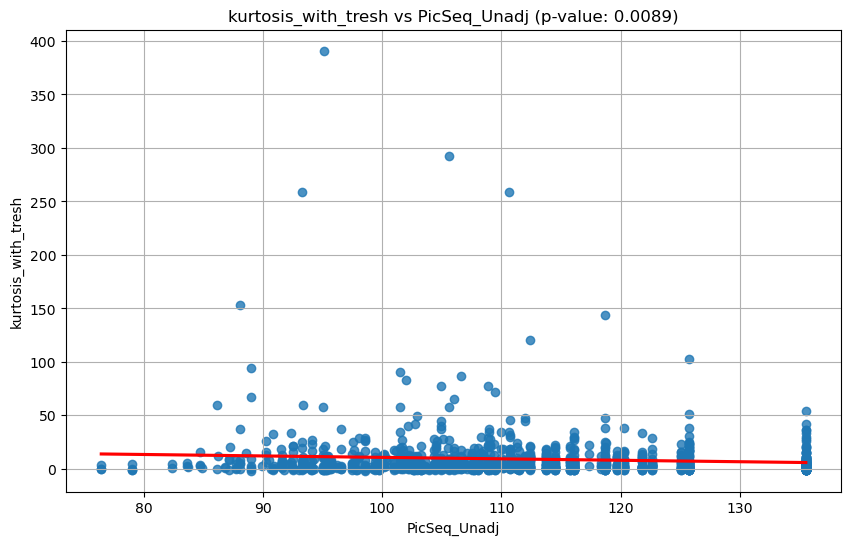

Regression summary for PicSeq_Unadj:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.006
Model:                             OLS   Adj. R-squared:                  0.005
Method:                  Least Squares   F-statistic:                     6.869
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00889
Time:                         16:55:22   Log-Likelihood:                -4915.3
No. Observations:                 1083   AIC:                             9835.
Df Residuals:                     1081   BIC:                             9845.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------


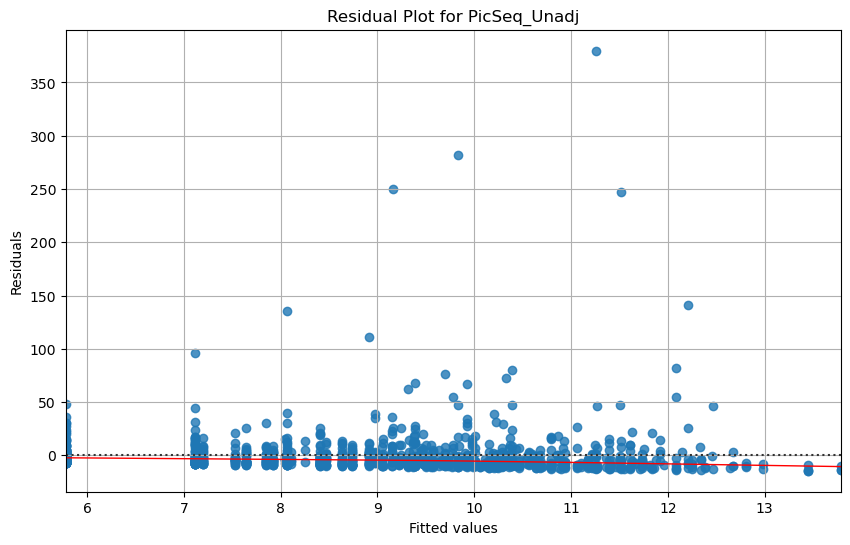

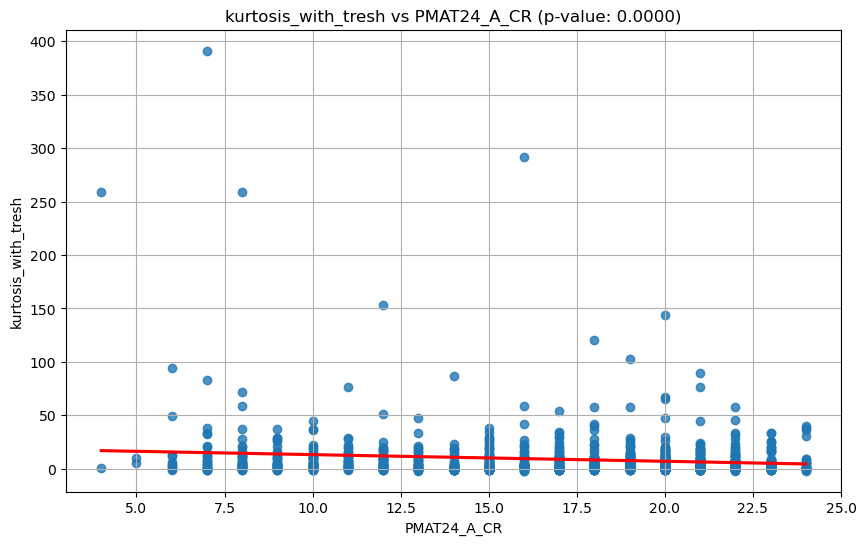

Regression summary for PMAT24_A_CR:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.017
Model:                             OLS   Adj. R-squared:                  0.016
Method:                  Least Squares   F-statistic:                     18.83
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):           1.56e-05
Time:                         16:55:22   Log-Likelihood:                -4884.8
No. Observations:                 1077   AIC:                             9774.
Df Residuals:                     1075   BIC:                             9784.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

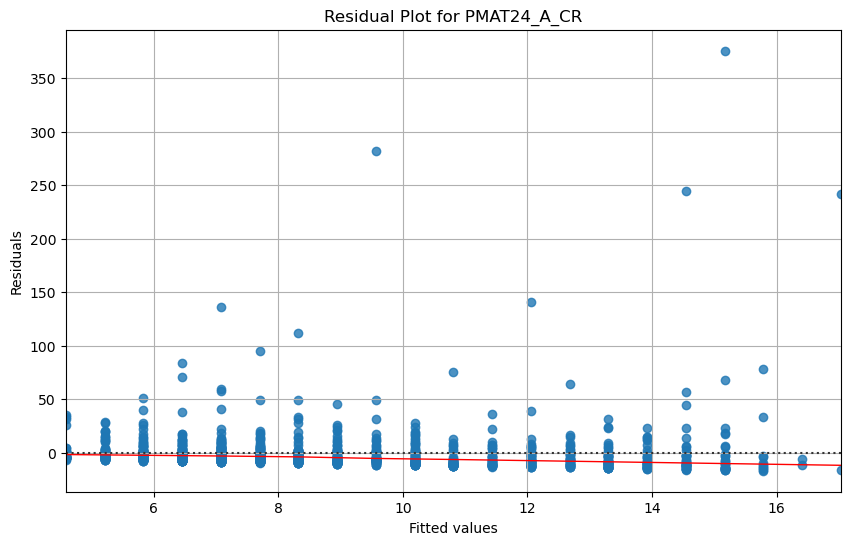

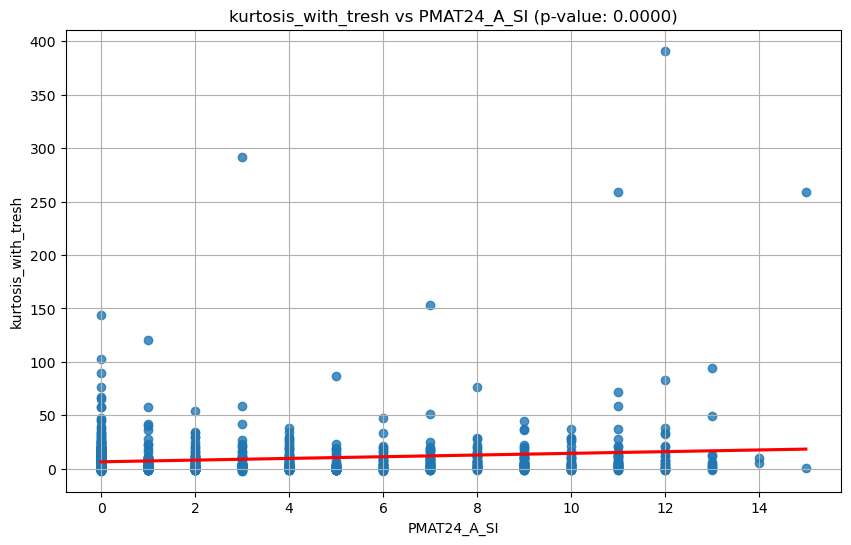

Regression summary for PMAT24_A_SI:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.018
Model:                             OLS   Adj. R-squared:                  0.018
Method:                  Least Squares   F-statistic:                     20.26
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):           7.50e-06
Time:                         16:55:22   Log-Likelihood:                -4884.1
No. Observations:                 1077   AIC:                             9772.
Df Residuals:                     1075   BIC:                             9782.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

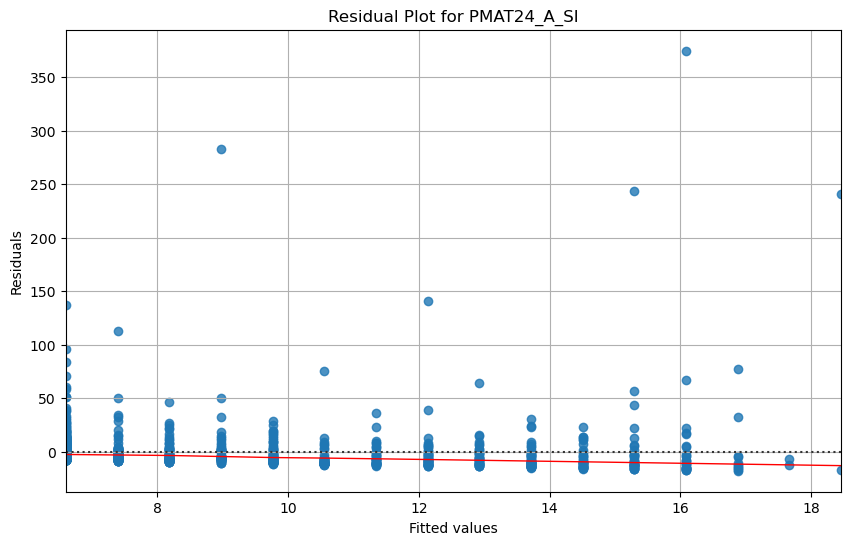

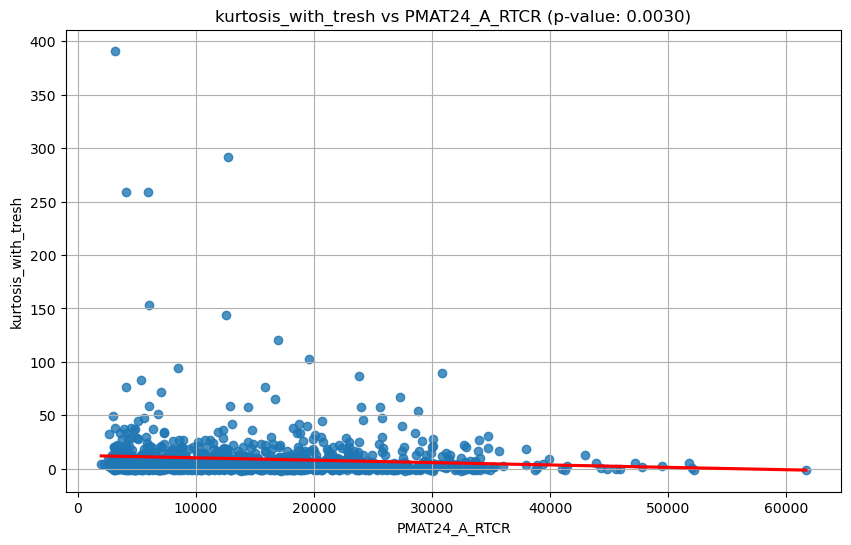

Regression summary for PMAT24_A_RTCR:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.008
Model:                             OLS   Adj. R-squared:                  0.007
Method:                  Least Squares   F-statistic:                     8.875
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00296
Time:                         16:55:22   Log-Likelihood:                -4889.7
No. Observations:                 1077   AIC:                             9783.
Df Residuals:                     1075   BIC:                             9793.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

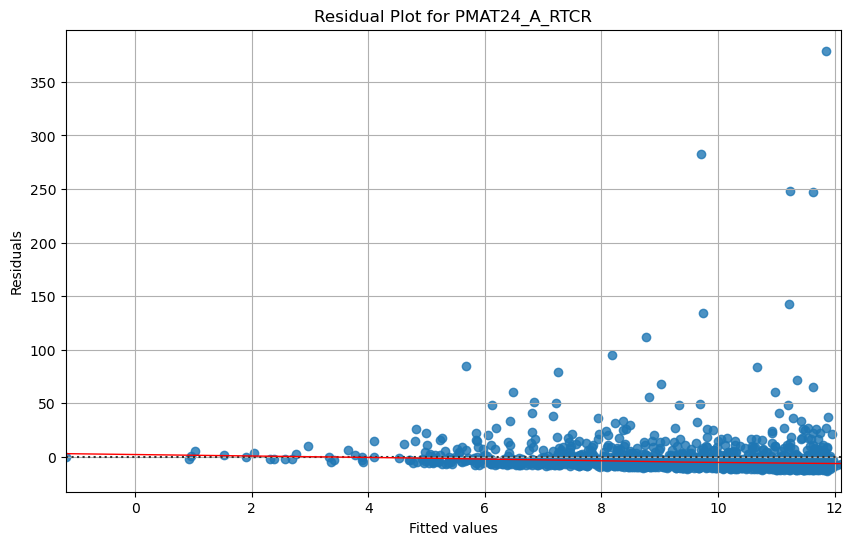

In [232]:
columns_of_interest = ['PicSeq_Unadj','PMAT24_A_CR', 'PMAT24_A_SI', 'PMAT24_A_RTCR']

# Convert specified columns to numeric, errors='coerce' will turn non-convertible values to NaN
for col in columns_of_interest:
    if col in merged_df_rest1.columns:
        merged_df_rest1[col] = pd.to_numeric(merged_df_rest1[col], errors='coerce')

statistics_of_interest = ['skewness_no_tresh','skewness_with_tresh','kurtosis_no_tresh', 'kurtosis_with_tresh']      
for n in range(len(statistics_of_interest)):
    for col in columns_of_interest:
        if col in merged_df_rest1.columns:
            df = merged_df_rest1[[statistics_of_interest[n], col]].dropna()
            if not df.empty: 
                X = sm.add_constant(df[col])
                y = df[statistics_of_interest[n]]
                model = sm.OLS(y, X).fit()
                p_value = model.pvalues[col]
                summary = model.summary()
                plt.figure(figsize=(10, 6))
                sns.regplot(x=col, y= statistics_of_interest[n], data=df, ci=None, line_kws={"color": "red"})
                plt.title(f'{statistics_of_interest[n]} vs {col} (p-value: {p_value:.4f})')
                plt.xlabel(col)
                plt.ylabel(statistics_of_interest[n])
                plt.grid(True)
                plt.show()
                print(f"Regression summary for {col}:\n")
                print(summary)
                residuals = model.resid
                fitted = model.fittedvalues
                plt.figure(figsize=(10, 6))
                sns.residplot(x=fitted, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
                plt.title(f'Residual Plot for {col}')
                plt.xlabel('Fitted values')
                plt.ylabel('Residuals')
                plt.grid(True)
                plt.show()          

In [225]:
#now lets split into male and female

In [233]:
merged_df_rest1

,Subject,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh,Release,Acquisition,Gender,Age,3T_Full_MR_Compl,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final
0,128935,-0.033675,-3.863154,-1.998866,12.923957,S900,Q09,M,31-35,True,...,4.4,108.79,98.04,1.0,43.8,69.25,66.84,1.92,2.0,1.84
1,190031,-0.005051,-0.824955,-1.999974,-1.319449,Q3,Q03,F,26-30,True,...,5.2,122.25,110.45,0.0,38.6,103.37,102.15,1.76,0.0,1.76
2,116423,-0.015152,-1.599513,-1.999770,0.558442,S1200,Q09,M,26-30,False,...,3.6,101.12,86.45,6.0,58.5,99.67,100.24,1.84,0.0,1.84
3,849264,-0.052206,-1.278885,-1.997274,-0.364452,S900,Q10,F,31-35,True,...,6.0,108.79,98.04,0.0,38.6,76.41,73.80,1.92,0.0,1.92
4,784565,-0.043782,-0.791161,-1.998083,-1.374065,S500,Q06,F,26-30,True,...,2.8,122.25,110.45,0.0,38.6,101.63,101.22,1.84,0.0,1.84
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1079,249947,0.008418,-3.730168,-1.999929,11.914151,Q1,Q01,F,31-35,False,...,4.4,122.25,111.41,1.0,51.1,119.77,118.98,1.72,0.0,1.72
1080,571548,0.018519,-16.155612,-1.999657,259.003802,Q3,Q04,M,26-30,False,...,9.2,108.79,97.19,8.0,75.3,98.31,99.06,1.76,0.0,1.76
1081,192136,0.003367,-2.068173,-1.999989,2.277338,S900,Q11,M,22-25,True,...,5.2,108.79,97.19,1.0,49.7,75.95,74.32,1.80,0.0,1.80
1082,175035,-0.028622,-0.985267,-1.999181,-1.029249,S500,Q05,M,22-25,True,...,7.6,96.87,77.12,0.0,38.6,126.51,128.53,1.80,2.0,1.72


In [239]:
merged_df_rest1_male = merged_df_rest1[merged_df_rest1['Gender'] == 'M']
merged_df_rest1_female = merged_df_rest1[merged_df_rest1['Gender'] == 'F']

In [240]:
merged_df_rest1_male

,Subject,skewness_no_tresh,skewness_with_tresh,kurtosis_no_tresh,kurtosis_with_tresh,Release,Acquisition,Gender,Age,3T_Full_MR_Compl,...,Noise_Comp,Odor_Unadj,Odor_AgeAdj,PainIntens_RawScore,PainInterf_Tscore,Taste_Unadj,Taste_AgeAdj,Mars_Log_Score,Mars_Errs,Mars_Final
0,128935,-0.033675,-3.863154,-1.998866,12.923957,S900,Q09,M,31-35,True,...,4.4,108.79,98.04,1.0,43.8,69.25,66.84,1.92,2.0,1.84
2,116423,-0.015152,-1.599513,-1.999770,0.558442,S1200,Q09,M,26-30,False,...,3.6,101.12,86.45,6.0,58.5,99.67,100.24,1.84,0.0,1.84
5,304020,0.020203,-1.310186,-1.999592,-0.283412,Q1,Q02,M,31-35,True,...,4.4,96.87,77.61,1.0,38.6,82.51,80.71,1.84,1.0,1.80
6,803240,-0.026938,-1.890165,-1.999274,1.572726,S900,Q09,M,22-25,True,...,3.6,101.12,86.45,0.0,38.6,56.35,60.35,1.80,0.0,1.80
7,314225,0.005051,-1.106220,-1.999974,-0.776278,S1200,Q12,M,22-25,True,...,3.6,108.79,97.19,3.0,57.3,79.67,78.91,15.00,1.0,14.96
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1076,871762,0.057263,-2.088370,-1.996721,2.361290,S500,Q06,M,26-30,True,...,5.2,101.12,86.45,0.0,38.6,92.84,91.14,1.80,0.0,1.80
1080,571548,0.018519,-16.155612,-1.999657,259.003802,Q3,Q04,M,26-30,False,...,9.2,108.79,97.19,8.0,75.3,98.31,99.06,1.76,0.0,1.76
1081,192136,0.003367,-2.068173,-1.999989,2.277338,S900,Q11,M,22-25,True,...,5.2,108.79,97.19,1.0,49.7,75.95,74.32,1.80,0.0,1.80
1082,175035,-0.028622,-0.985267,-1.999181,-1.029249,S500,Q05,M,22-25,True,...,7.6,96.87,77.12,0.0,38.6,126.51,128.53,1.80,2.0,1.72


In [251]:
import matplotlib.pyplot as plt
import statsmodels.api as sm

# List of columns to test
columns_to_test = [
    'MMSE_Score', 'PSQI_Score', 'PSQI_Comp1', 'PSQI_Comp2', 'PSQI_Comp3',
    'PSQI_Comp4', 'PSQI_Comp5', 'PSQI_Comp6', 'PSQI_Comp7', 'PSQI_BedTime',
    'PSQI_Min2Asleep', 'PSQI_GetUpTime', 'PSQI_AmtSleep',
    'PSQI_Latency30Min', 'PSQI_WakeUp', 'PSQI_Bathroom', 'PSQI_Breathe',
    'PSQI_Snore', 'PSQI_TooCold', 'PSQI_TooHot', 'PSQI_BadDream',
    'PSQI_Pain', 'PSQI_Other', 'PSQI_Quality', 'PSQI_SleepMeds',
    'PSQI_DayStayAwake', 'PSQI_DayEnthusiasm', 'PSQI_BedPtnrRmate',
    'PicSeq_Unadj', 'PicSeq_AgeAdj', 'CardSort_Unadj', 'CardSort_AgeAdj',
    'Flanker_Unadj', 'Flanker_AgeAdj', 'PMAT24_A_CR', 'PMAT24_A_SI',
    'PMAT24_A_RTCR', 'ReadEng_Unadj', 'ReadEng_AgeAdj', 'PicVocab_Unadj'
]

for col in columns_to_test:
    if col in merged_df_rest1_female.columns:
        merged_df_rest1_female[col] = pd.to_numeric(merged_df_rest1_female[col], errors='coerce')
        
data_statistics = ["skewness_no_tresh",
"skewness_with_tresh",
"kurtosis_no_tresh",
"kurtosis_with_tresh"]       
        
def p_values_plot(ind):
    for col in columns_to_test:
        if col in merged_df_rest1_female.columns:
            df = merged_df_rest1_female[[data_statistics[ind], col]].dropna()
            if not df.empty:  # Ensure there's data to plot
                x = np.linspace(0, 10, 100)
                X = sm.add_constant(df[col])
                y = df[data_statistics[ind]]
                model = sm.OLS(y, X).fit()
                p_value = model.pvalues[col]
                plt.figure()
                plt.scatter(df[col], df[data_statistics[ind]])
                plt.title(f'{data_statistics[ind]} vs {col} (p-value: {p_value:.4f})')
                plt.xlabel(col)
                plt.ylabel(data_statistics[ind])
                plt.grid(True)
                plt.show()

/var/folders/wv/yqzymj311hb6rngybcgnr4v00000gp/T/ipykernel_959/2274670215.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_rest1_female[col] = pd.to_numeric(merged_df_rest1_female[col], errors='coerce')


Start plotting  skewness_no_tresh


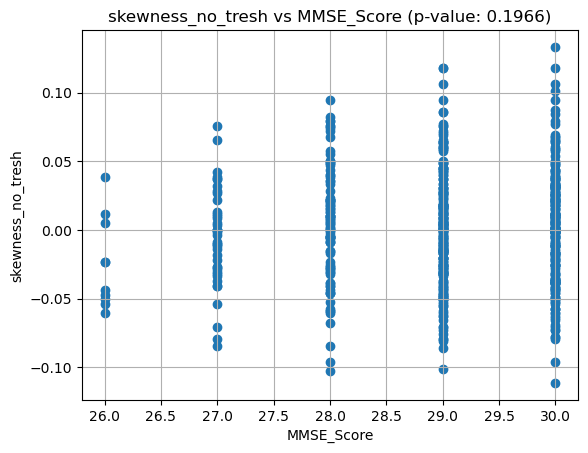

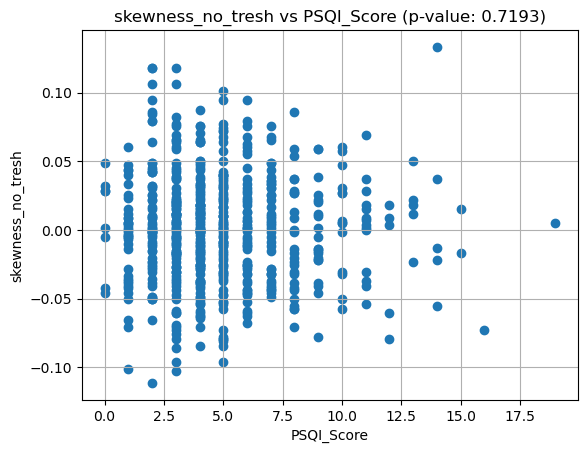

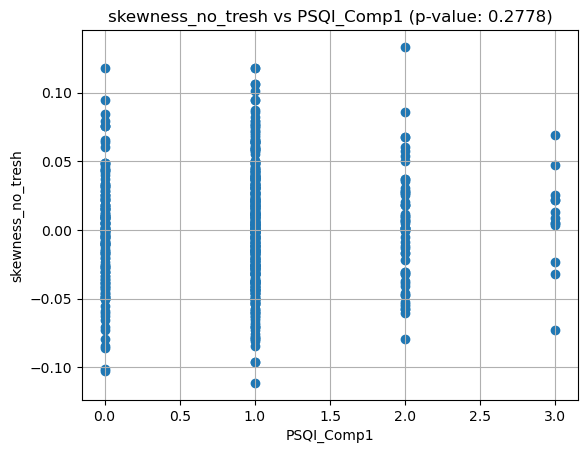

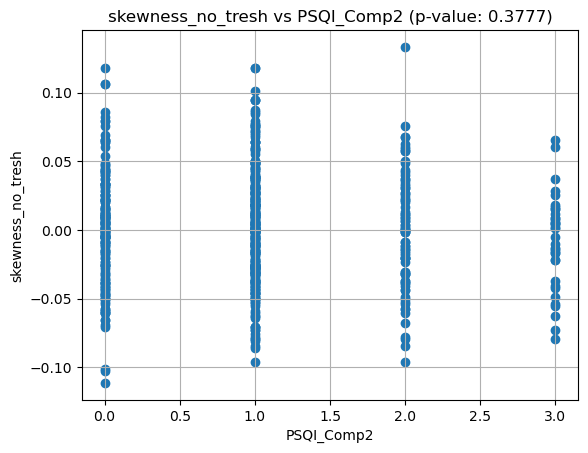

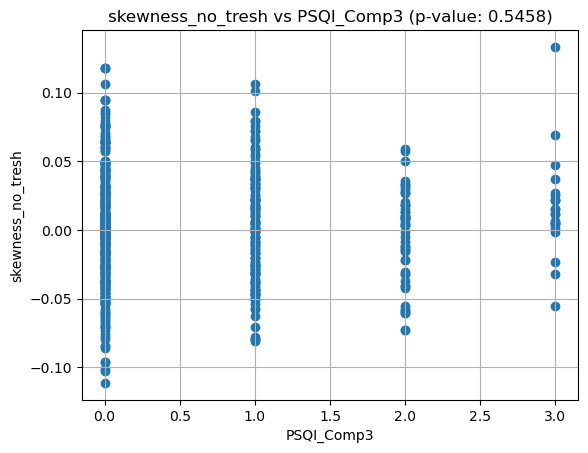

...

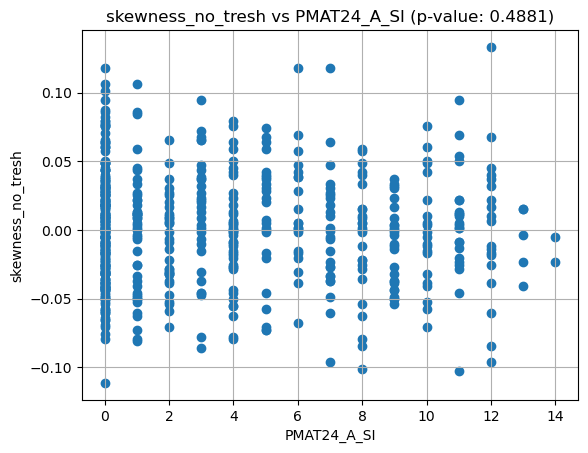

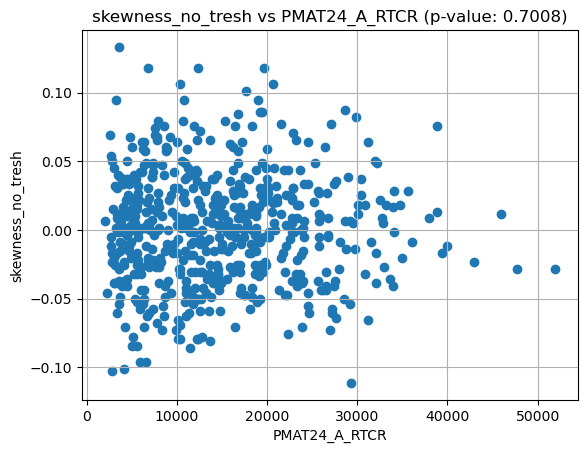

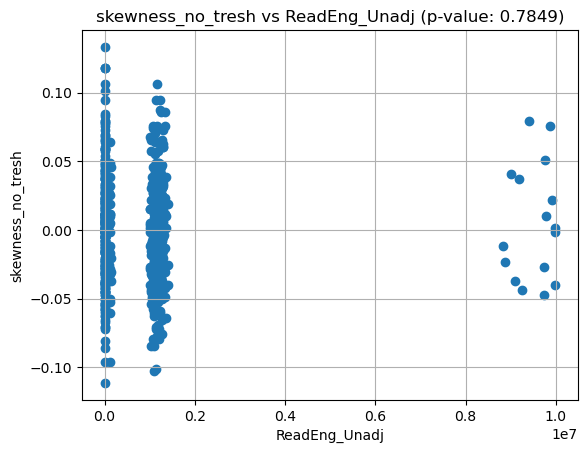

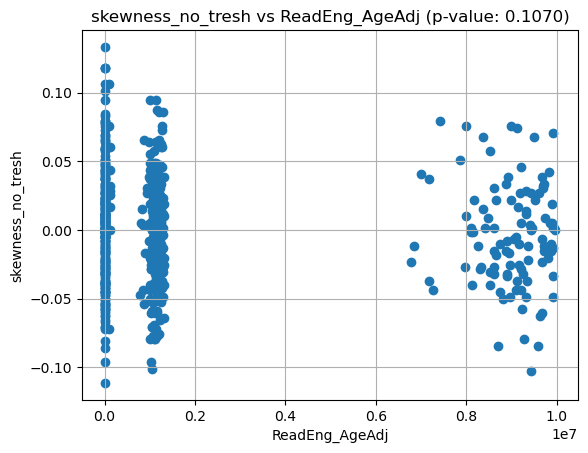

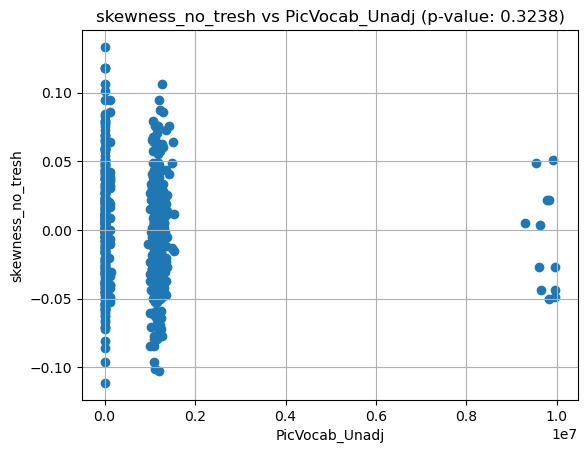

End plotting skewness_no_tresh

Start plotting  skewness_with_tresh


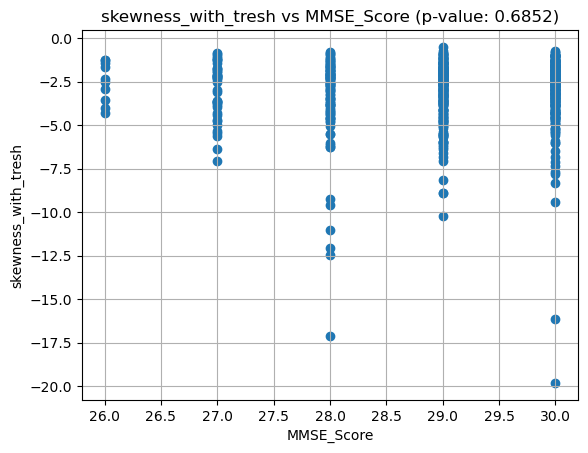

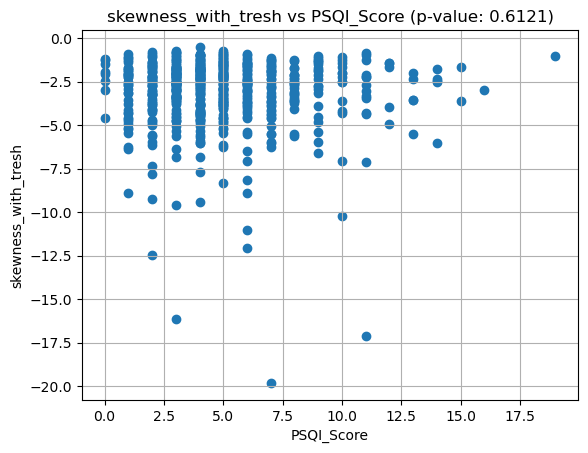

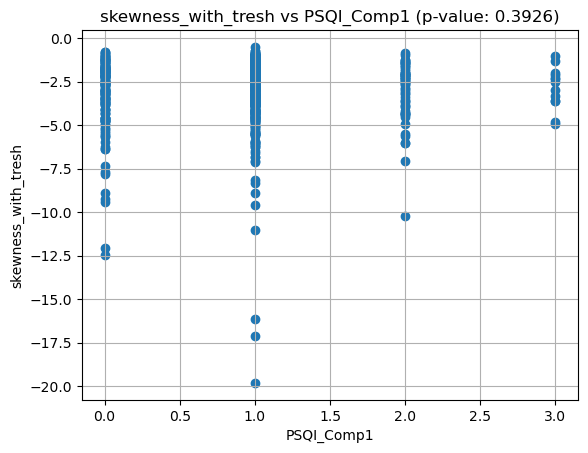

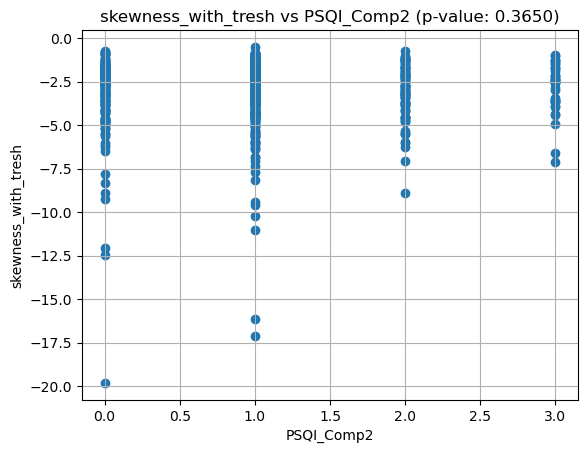

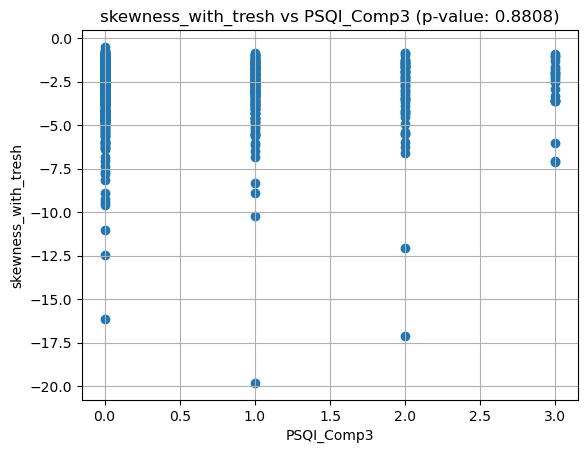

...

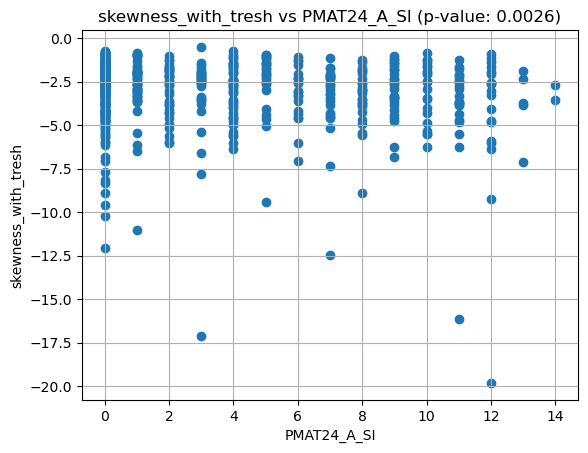

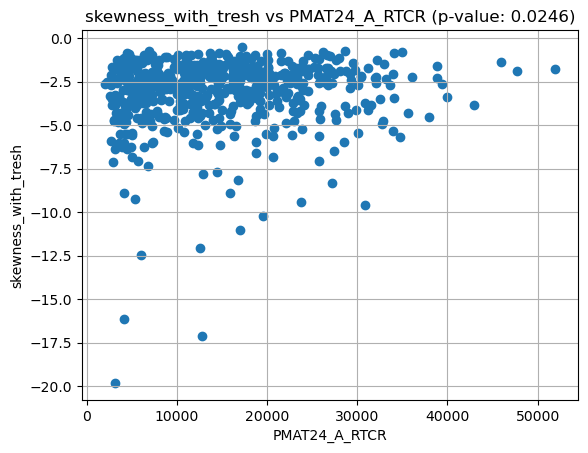

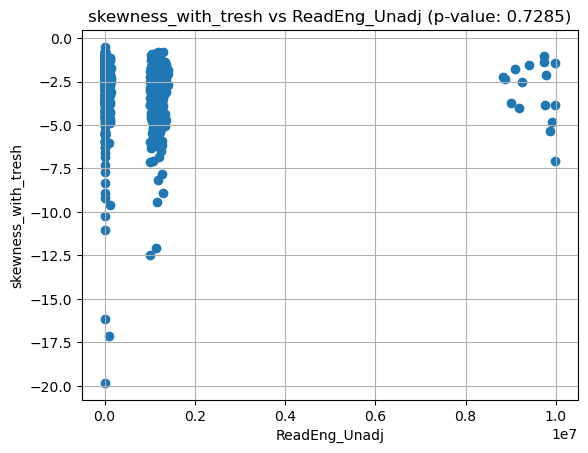

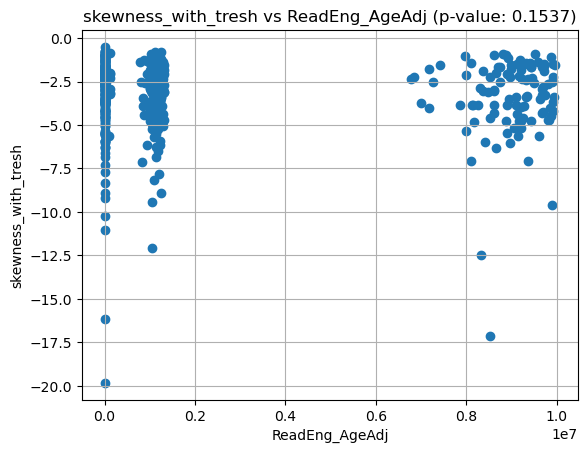

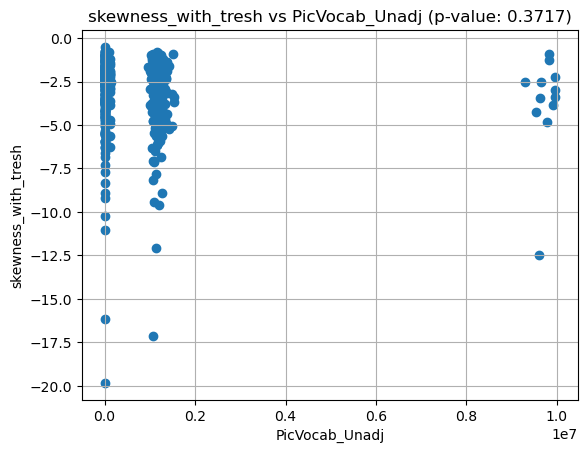

End plotting skewness_with_tresh

Start plotting  kurtosis_no_tresh


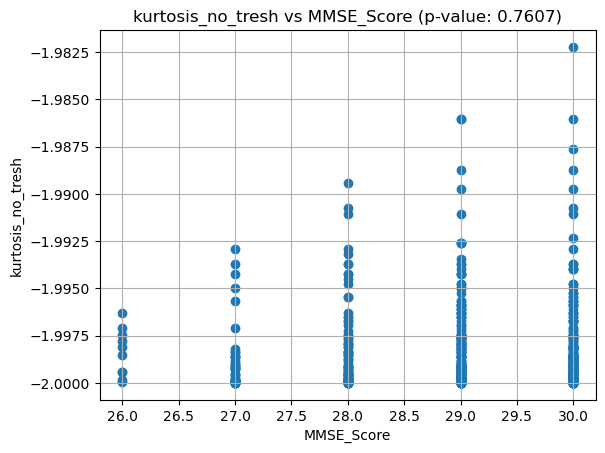

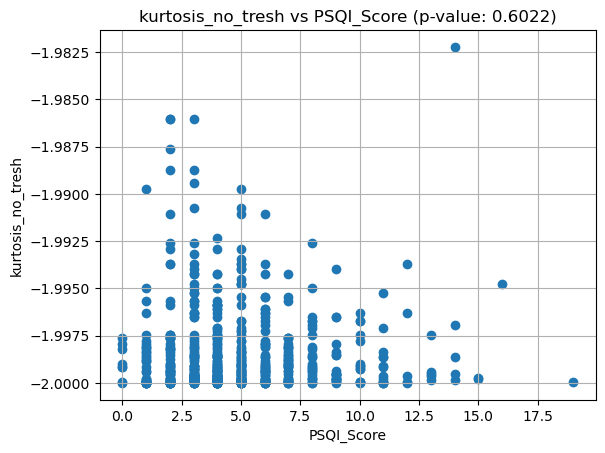

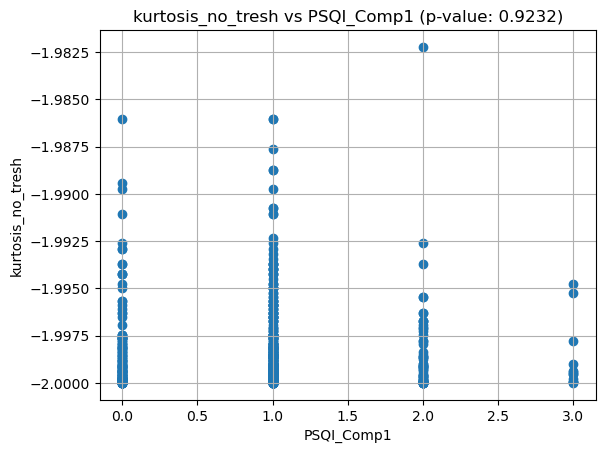

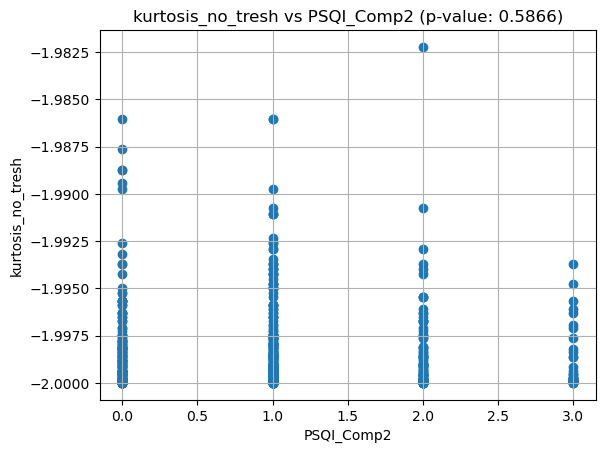

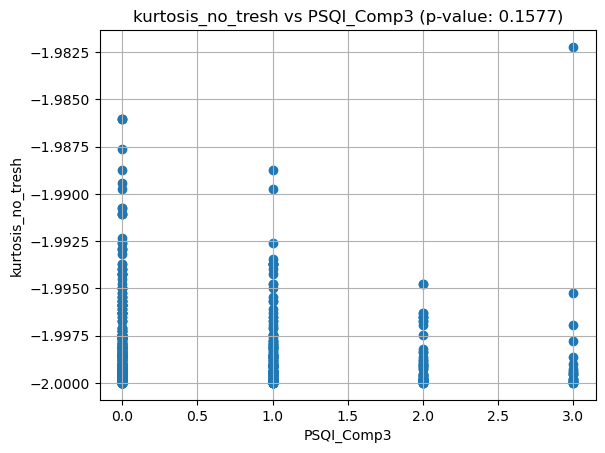

...

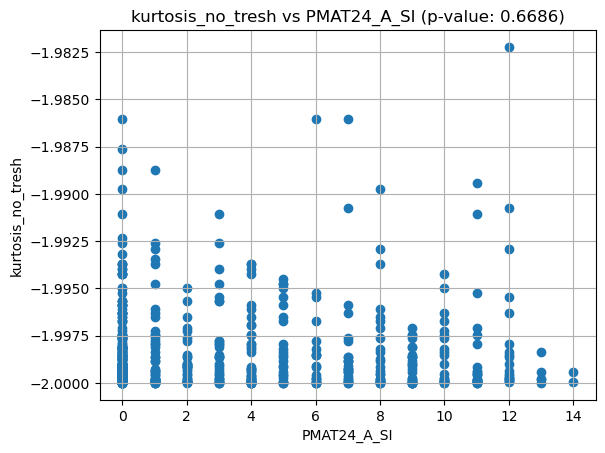

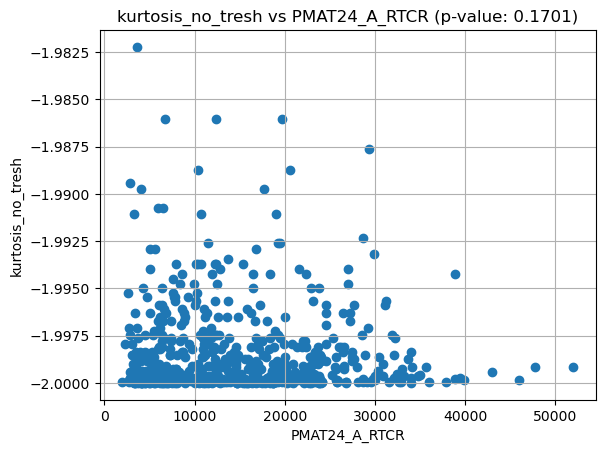

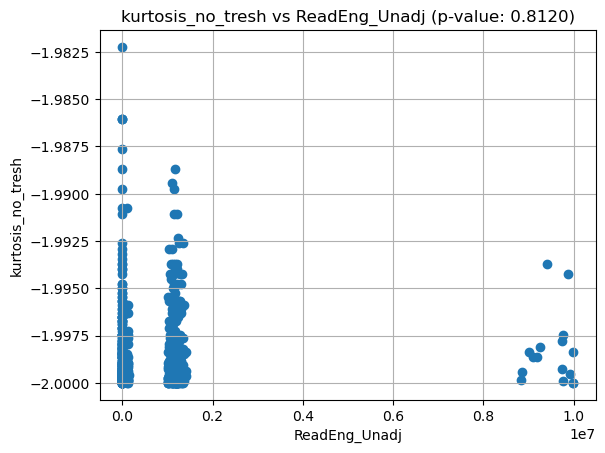

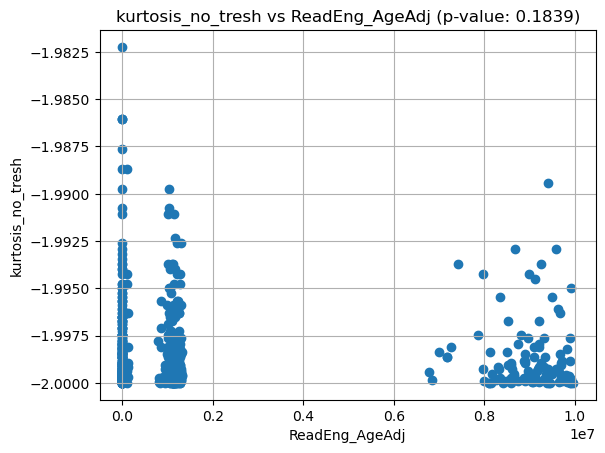

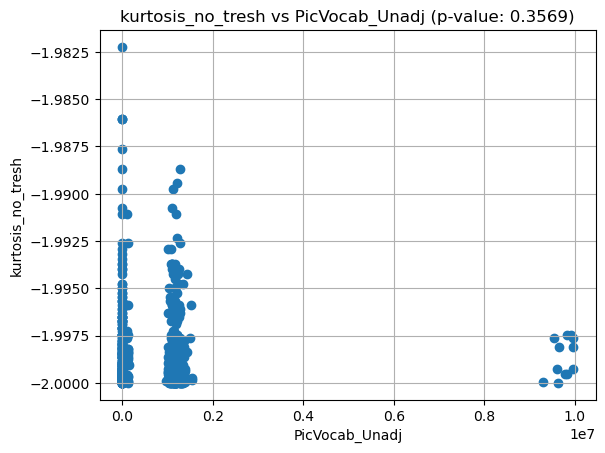

End plotting kurtosis_no_tresh

Start plotting  kurtosis_with_tresh


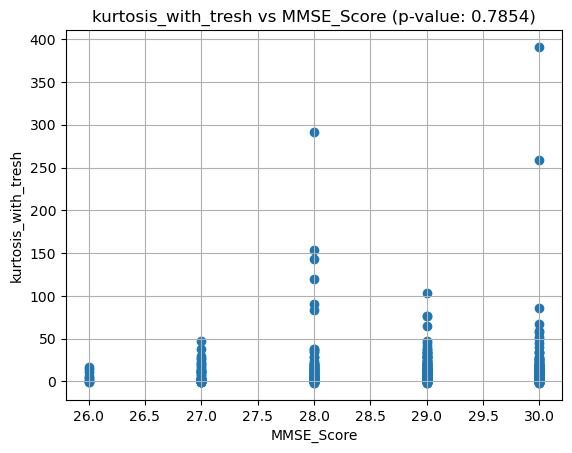

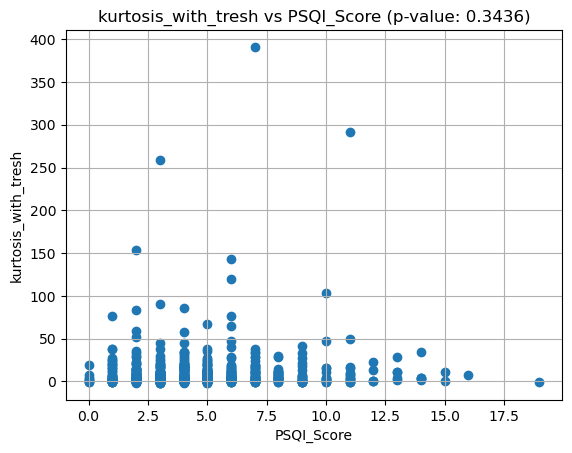

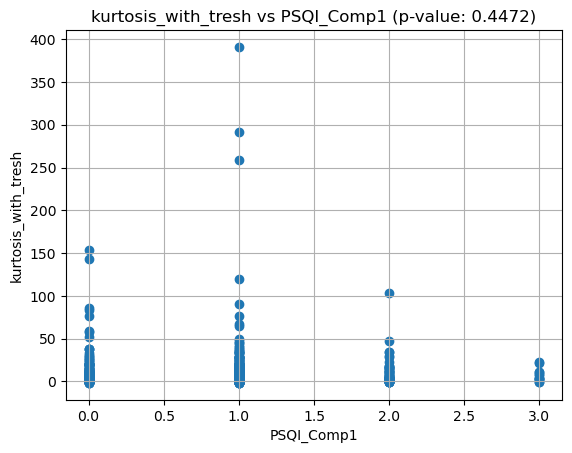

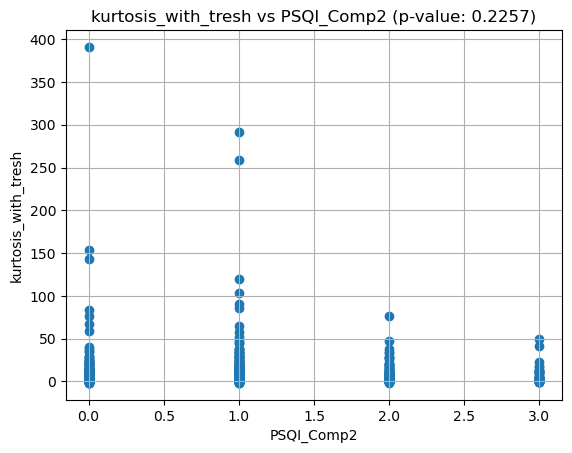

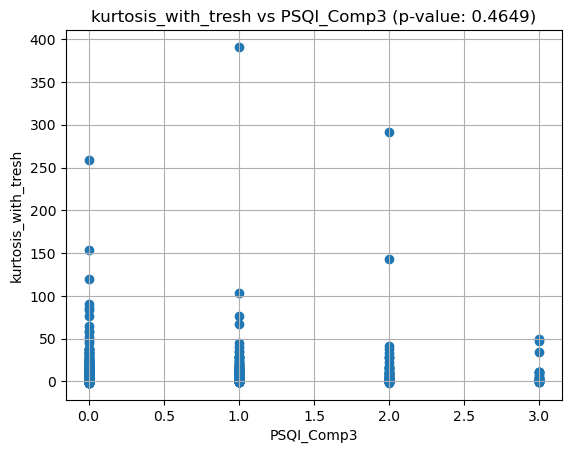

...

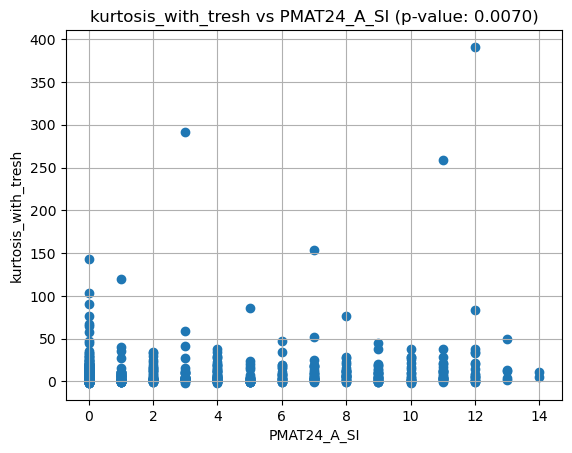

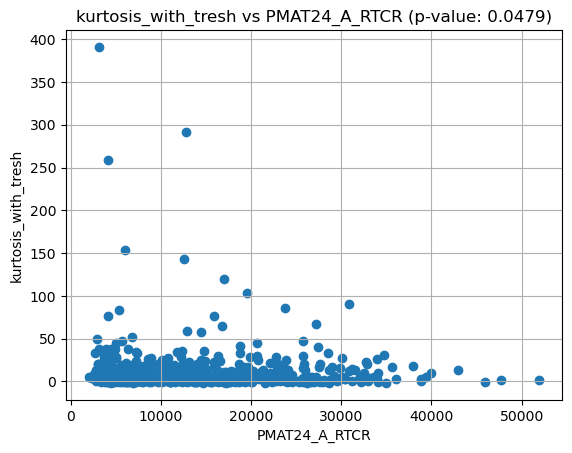

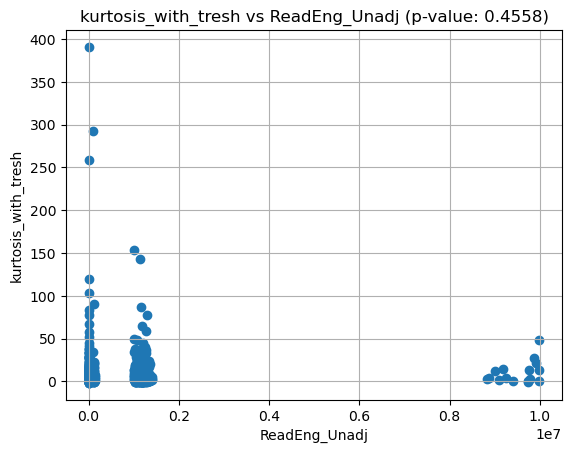

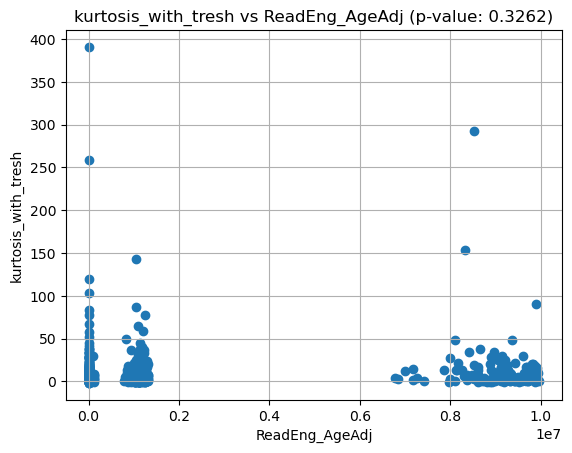

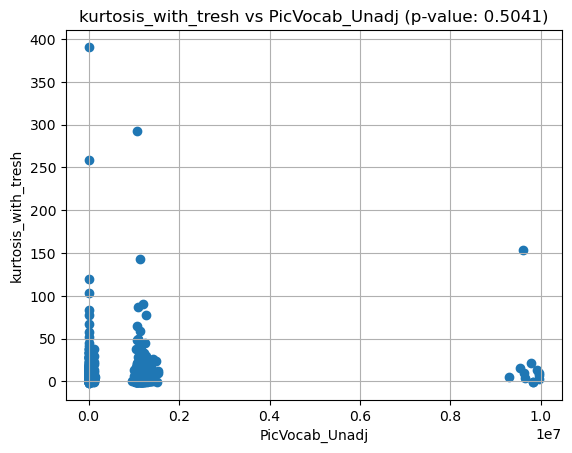

End plotting kurtosis_with_tresh



In [252]:
for n in range(len(data_statistics)):
    print(f"\033[32mStart plotting  {data_statistics[n]}\033[0m")
    p_values_plot(n)
    print(f"\033[31mEnd plotting {data_statistics[n]}\n\033[0m")

/var/folders/wv/yqzymj311hb6rngybcgnr4v00000gp/T/ipykernel_959/1316781650.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_rest1_female[col] = pd.to_numeric(merged_df_rest1_female[col], errors='coerce')


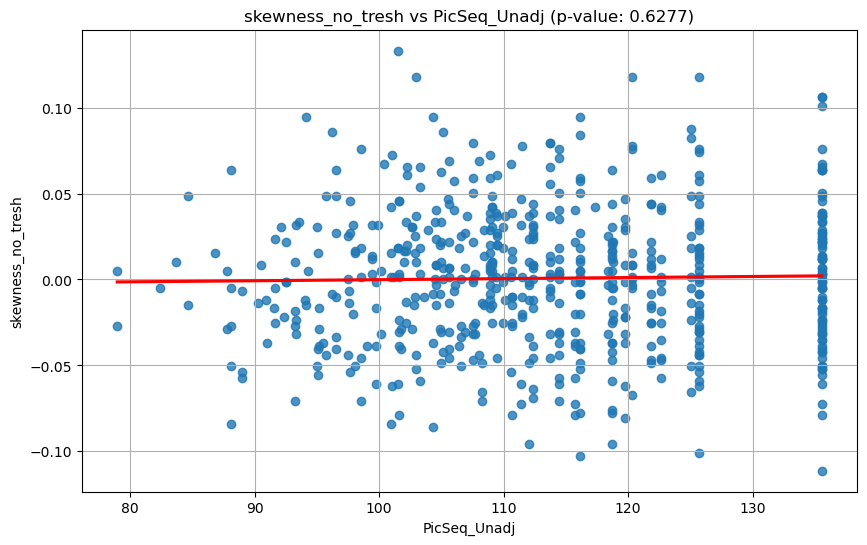

Regression summary for PicSeq_Unadj:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.2354
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.628
Time:                        17:39:46   Log-Likelihood:                 1052.3
No. Observations:                 587   AIC:                            -2101.
Df Residuals:                     585   BIC:                            -2092.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const     

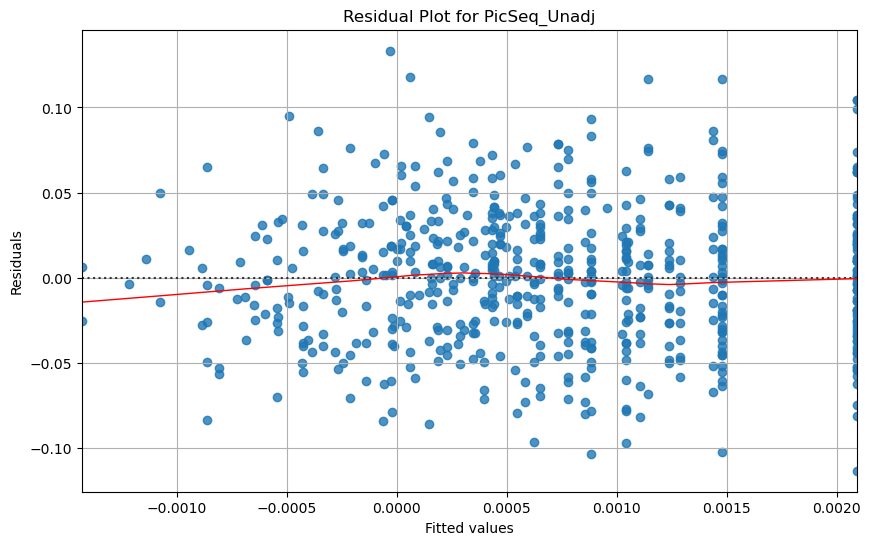

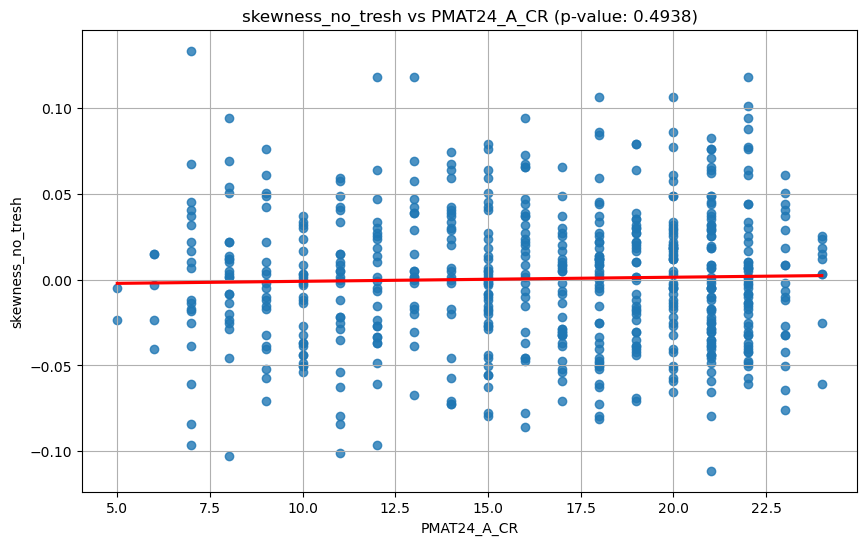

Regression summary for PMAT24_A_CR:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.4689
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.494
Time:                        17:39:46   Log-Likelihood:                 1041.4
No. Observations:                 581   AIC:                            -2079.
Df Residuals:                     579   BIC:                            -2070.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

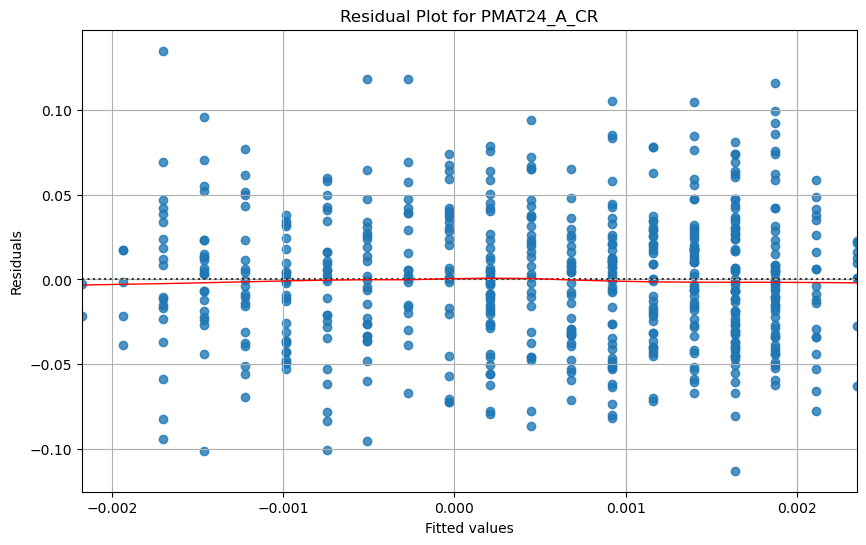

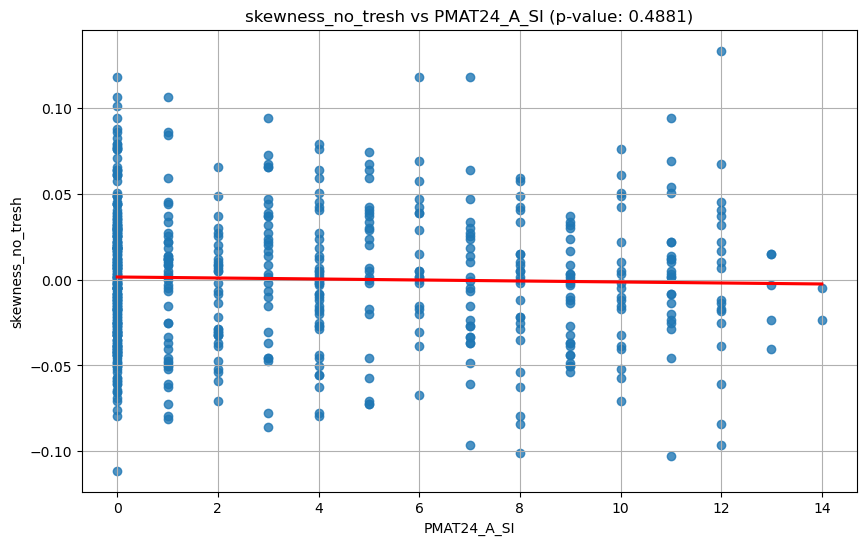

Regression summary for PMAT24_A_SI:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.4813
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.488
Time:                        17:39:46   Log-Likelihood:                 1041.4
No. Observations:                 581   AIC:                            -2079.
Df Residuals:                     579   BIC:                            -2070.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

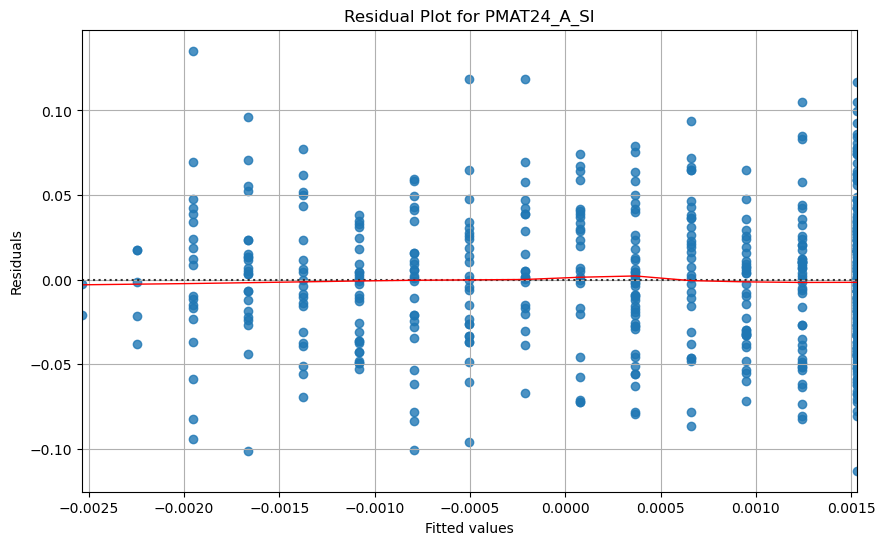

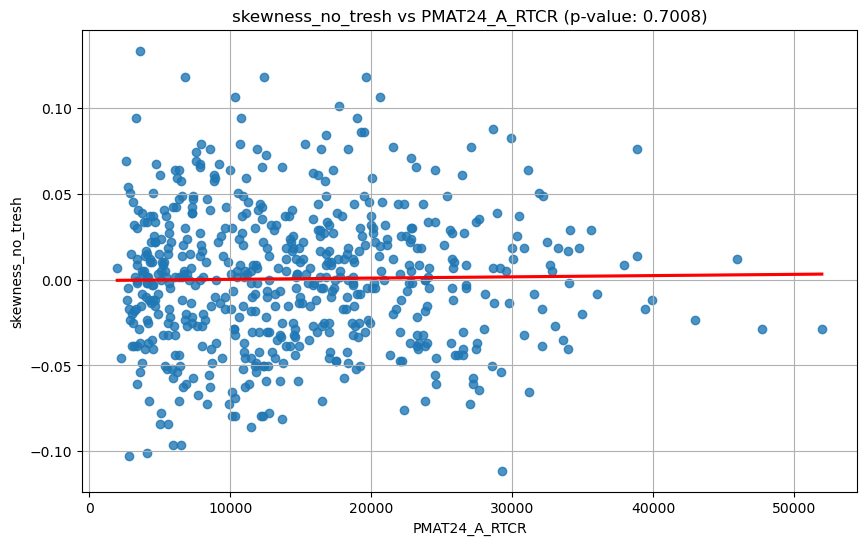

Regression summary for PMAT24_A_RTCR:

                            OLS Regression Results                            
Dep. Variable:      skewness_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.1478
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.701
Time:                        17:39:46   Log-Likelihood:                 1041.2
No. Observations:                 581   AIC:                            -2078.
Df Residuals:                     579   BIC:                            -2070.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const  

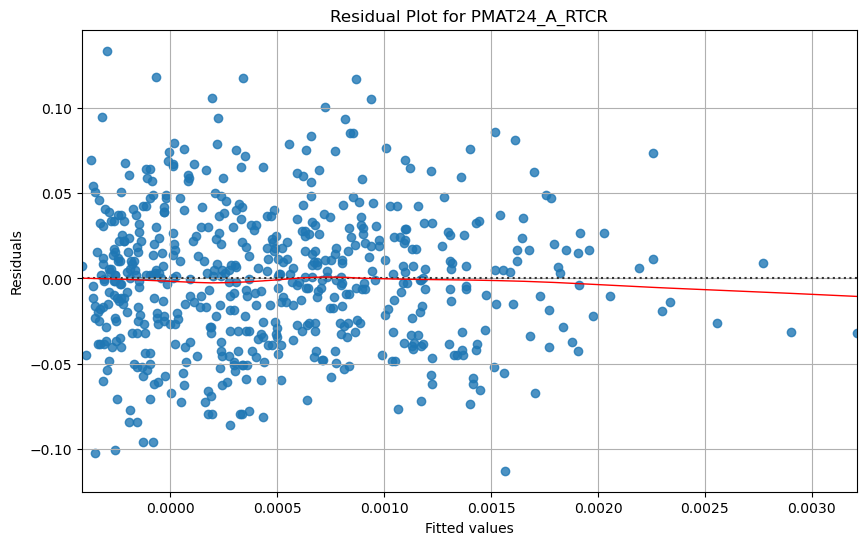

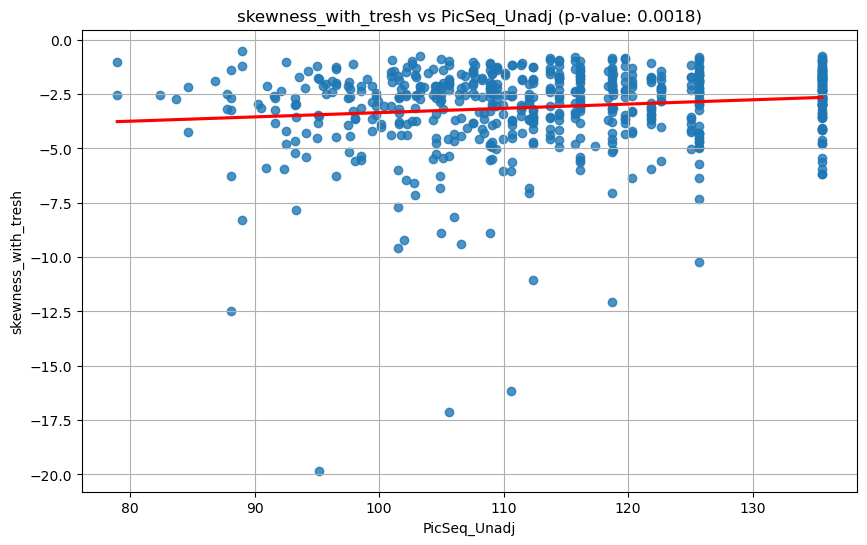

Regression summary for PicSeq_Unadj:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.017
Model:                             OLS   Adj. R-squared:                  0.015
Method:                  Least Squares   F-statistic:                     9.818
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00182
Time:                         17:39:46   Log-Likelihood:                -1231.8
No. Observations:                  587   AIC:                             2468.
Df Residuals:                      585   BIC:                             2476.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------


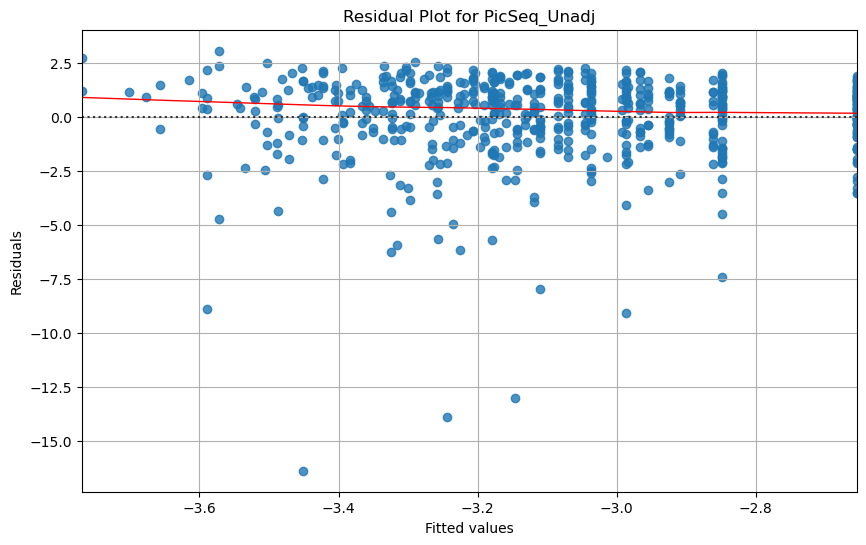

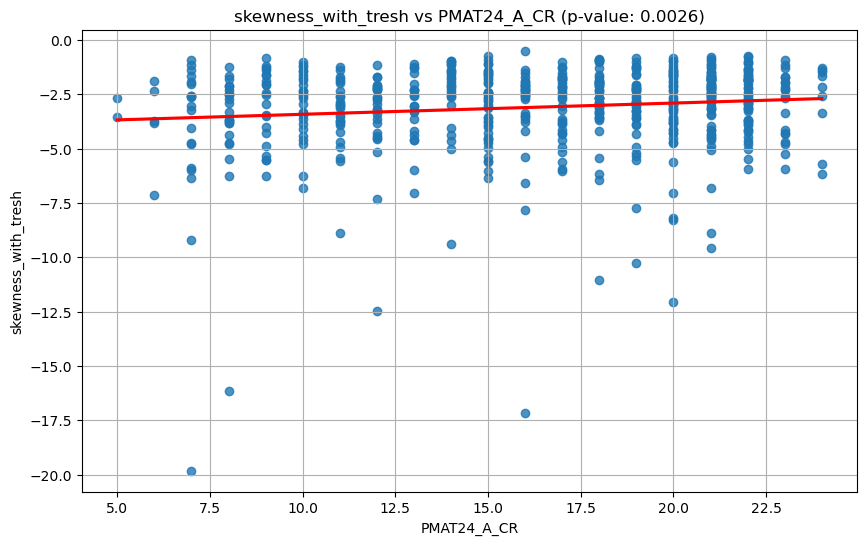

Regression summary for PMAT24_A_CR:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.016
Model:                             OLS   Adj. R-squared:                  0.014
Method:                  Least Squares   F-statistic:                     9.133
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00262
Time:                         17:39:46   Log-Likelihood:                -1221.3
No. Observations:                  581   AIC:                             2447.
Df Residuals:                      579   BIC:                             2455.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

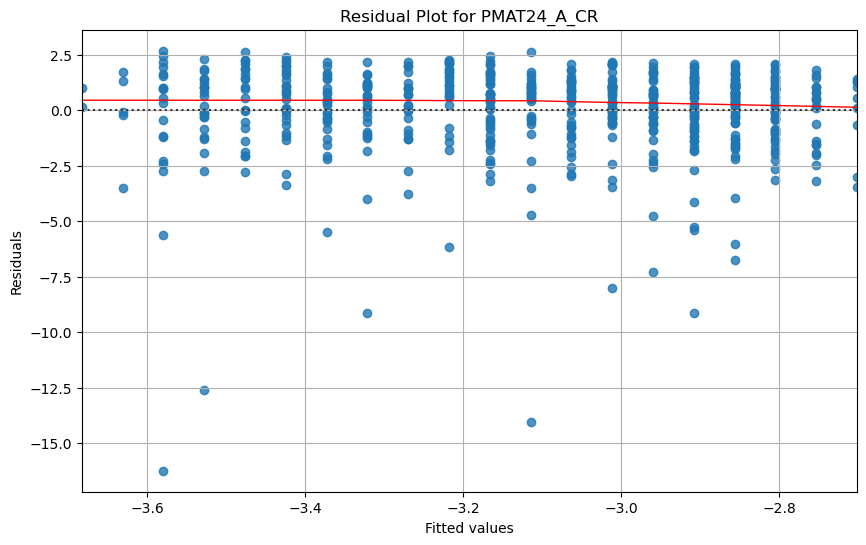

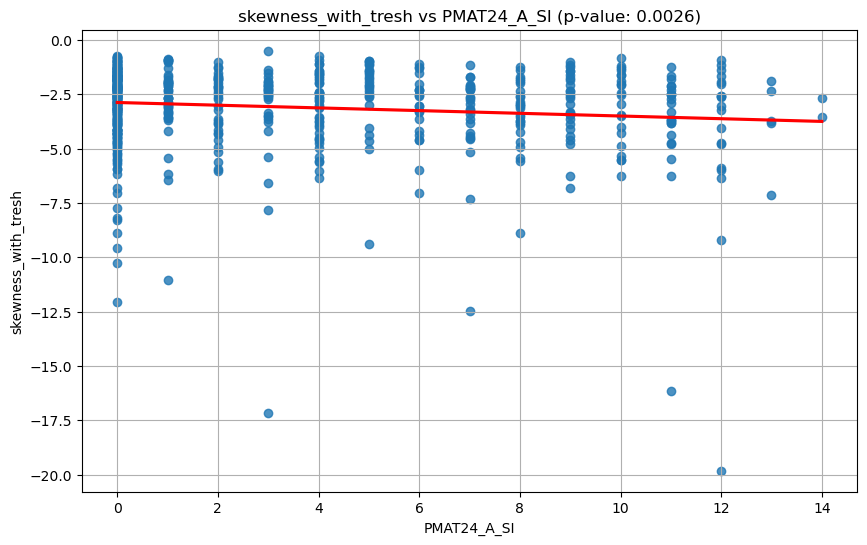

Regression summary for PMAT24_A_SI:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.016
Model:                             OLS   Adj. R-squared:                  0.014
Method:                  Least Squares   F-statistic:                     9.142
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00261
Time:                         17:39:47   Log-Likelihood:                -1221.2
No. Observations:                  581   AIC:                             2446.
Df Residuals:                      579   BIC:                             2455.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

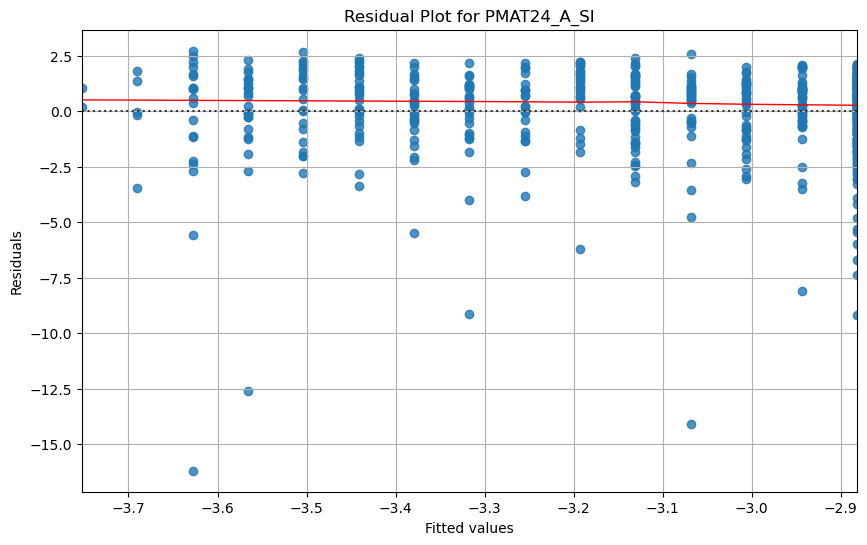

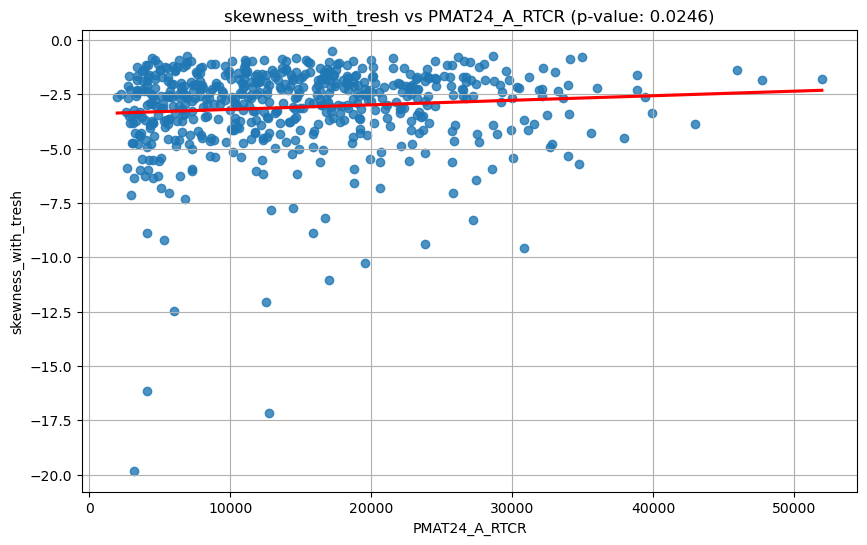

Regression summary for PMAT24_A_RTCR:

                             OLS Regression Results                            
Dep. Variable:     skewness_with_tresh   R-squared:                       0.009
Model:                             OLS   Adj. R-squared:                  0.007
Method:                  Least Squares   F-statistic:                     5.078
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):             0.0246
Time:                         17:39:47   Log-Likelihood:                -1223.3
No. Observations:                  581   AIC:                             2451.
Df Residuals:                      579   BIC:                             2459.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

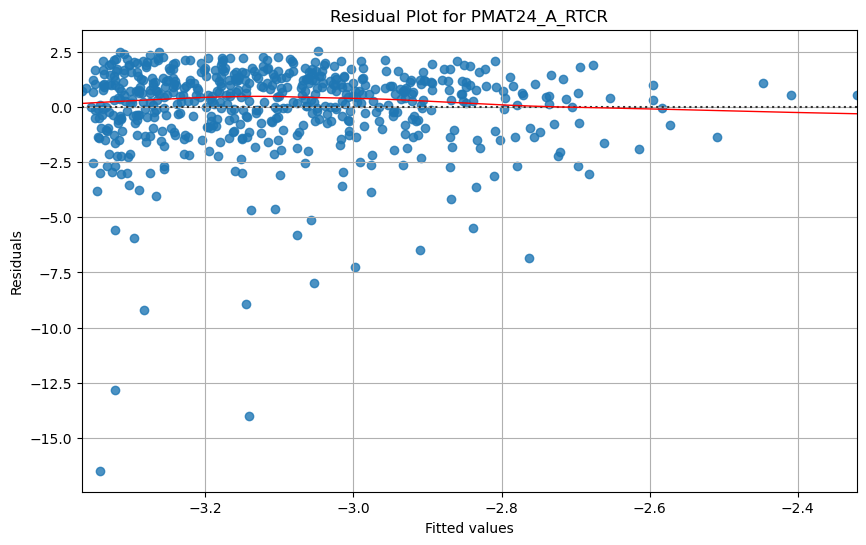

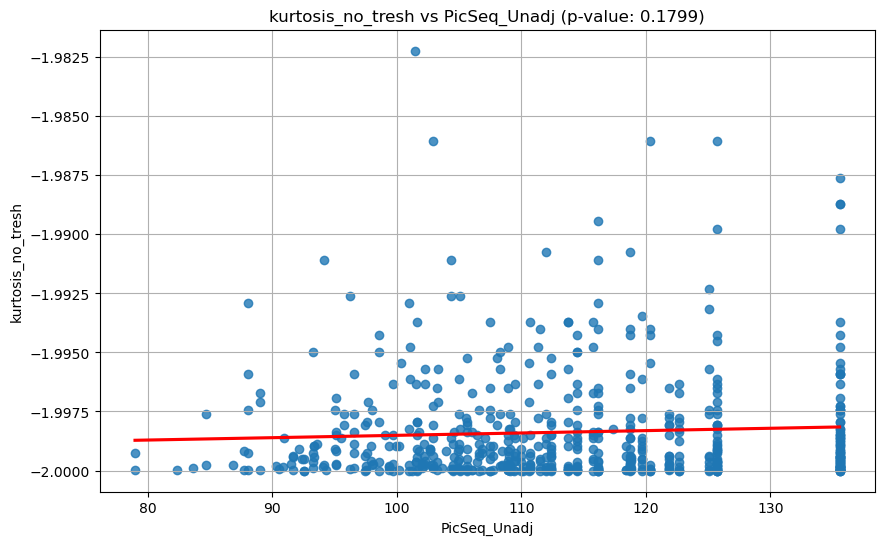

Regression summary for PicSeq_Unadj:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.803
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.180
Time:                        17:39:47   Log-Likelihood:                 2726.2
No. Observations:                 587   AIC:                            -5448.
Df Residuals:                     585   BIC:                            -5440.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const     

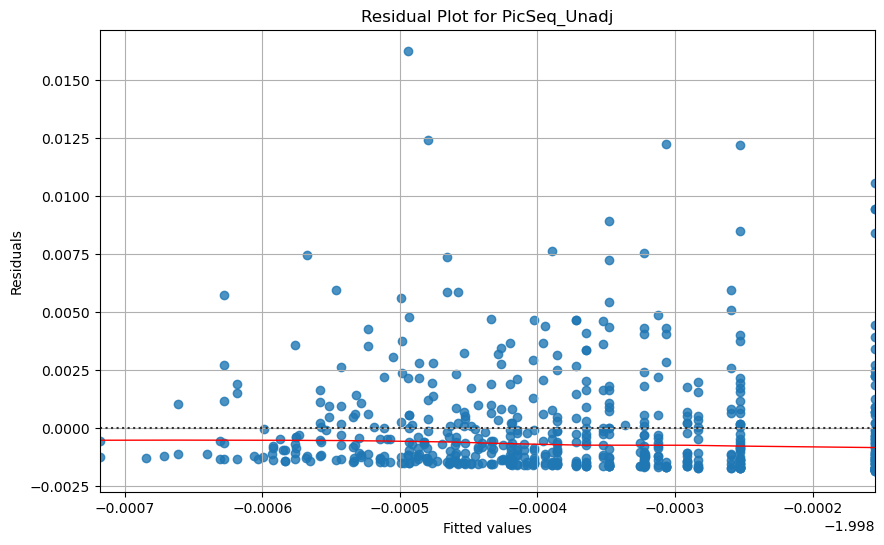

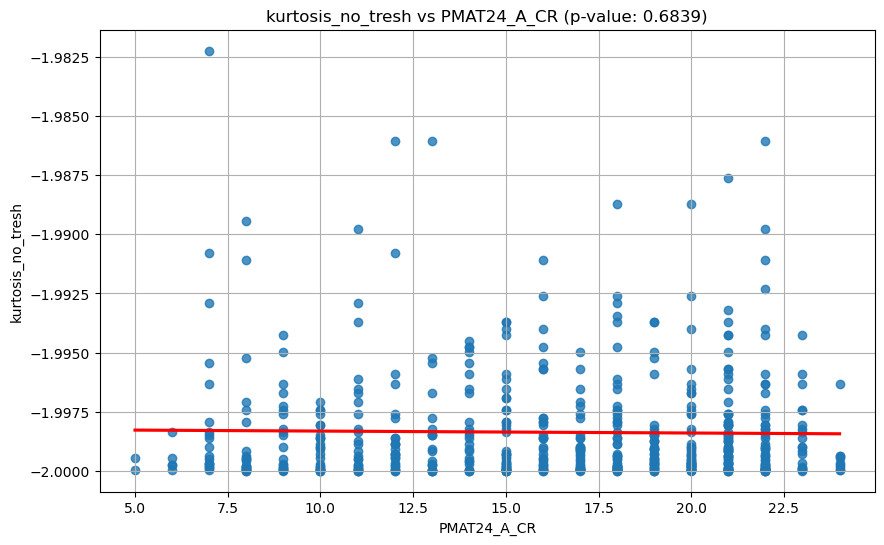

Regression summary for PMAT24_A_CR:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.1660
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.684
Time:                        17:39:47   Log-Likelihood:                 2696.7
No. Observations:                 581   AIC:                            -5389.
Df Residuals:                     579   BIC:                            -5381.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

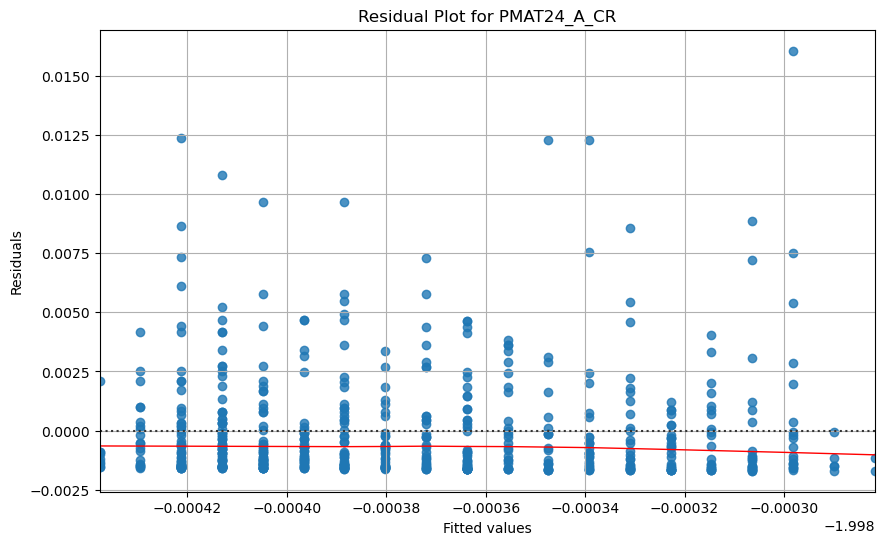

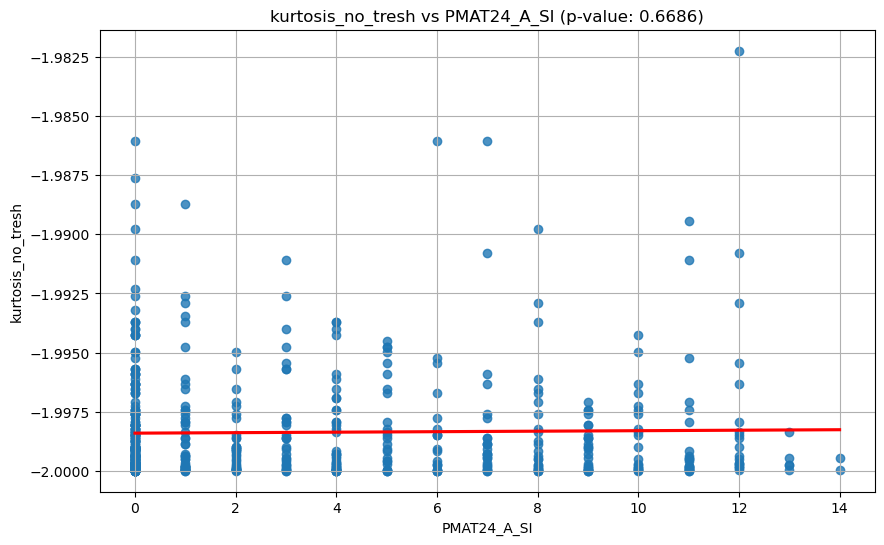

Regression summary for PMAT24_A_SI:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.1834
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.669
Time:                        17:39:47   Log-Likelihood:                 2696.7
No. Observations:                 581   AIC:                            -5389.
Df Residuals:                     579   BIC:                            -5381.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const        

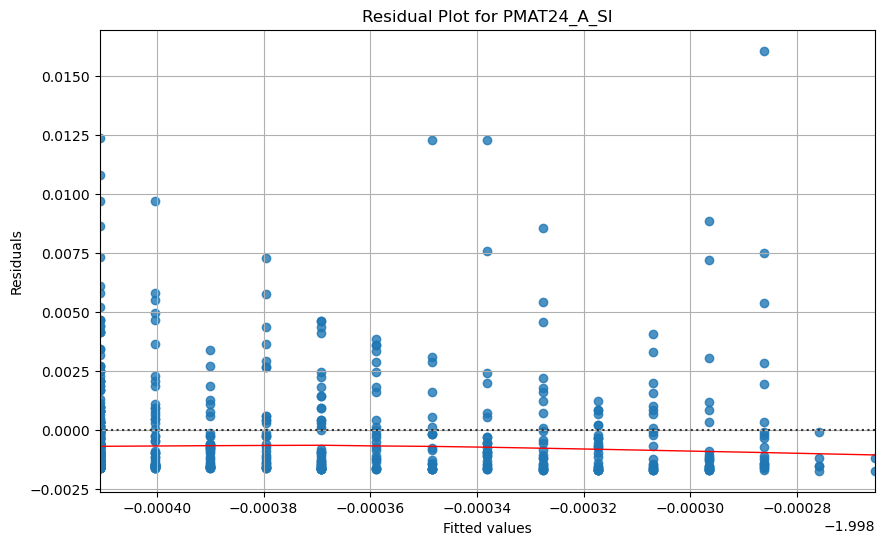

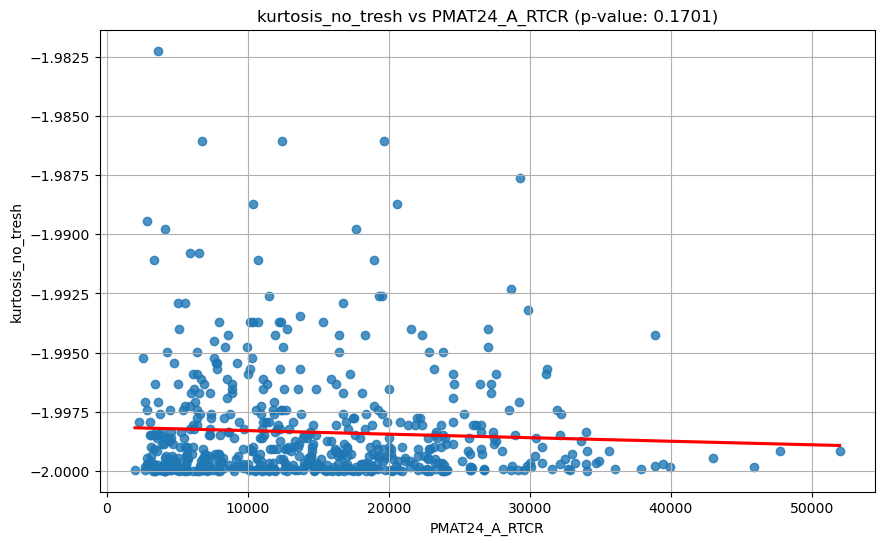

Regression summary for PMAT24_A_RTCR:

                            OLS Regression Results                            
Dep. Variable:      kurtosis_no_tresh   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.887
Date:                Sun, 14 Jul 2024   Prob (F-statistic):              0.170
Time:                        17:39:47   Log-Likelihood:                 2697.6
No. Observations:                 581   AIC:                            -5391.
Df Residuals:                     579   BIC:                            -5382.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const  

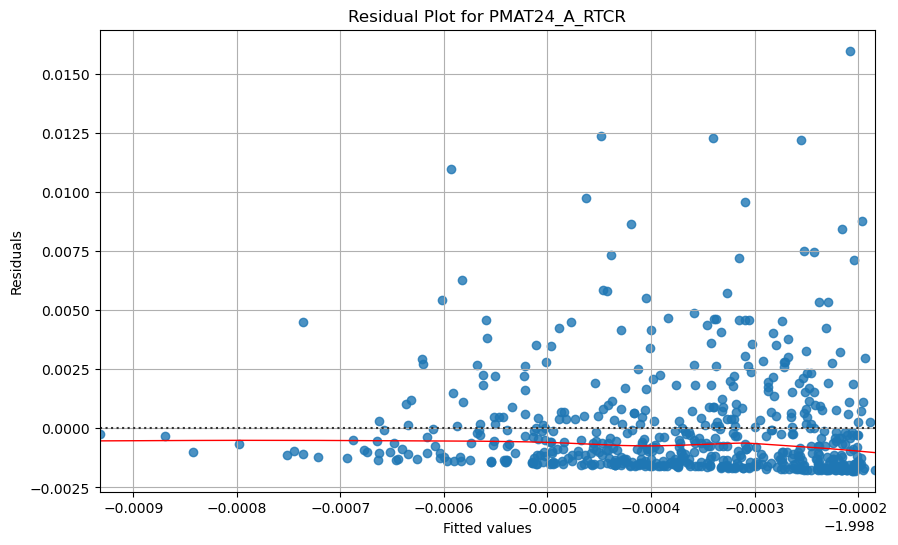

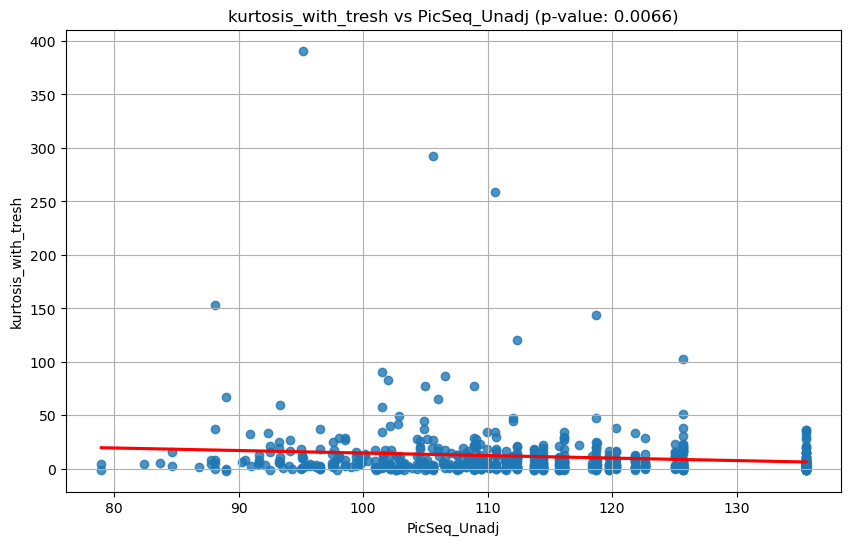

Regression summary for PicSeq_Unadj:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.013
Model:                             OLS   Adj. R-squared:                  0.011
Method:                  Least Squares   F-statistic:                     7.426
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00662
Time:                         17:39:48   Log-Likelihood:                -2770.4
No. Observations:                  587   AIC:                             5545.
Df Residuals:                      585   BIC:                             5553.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------


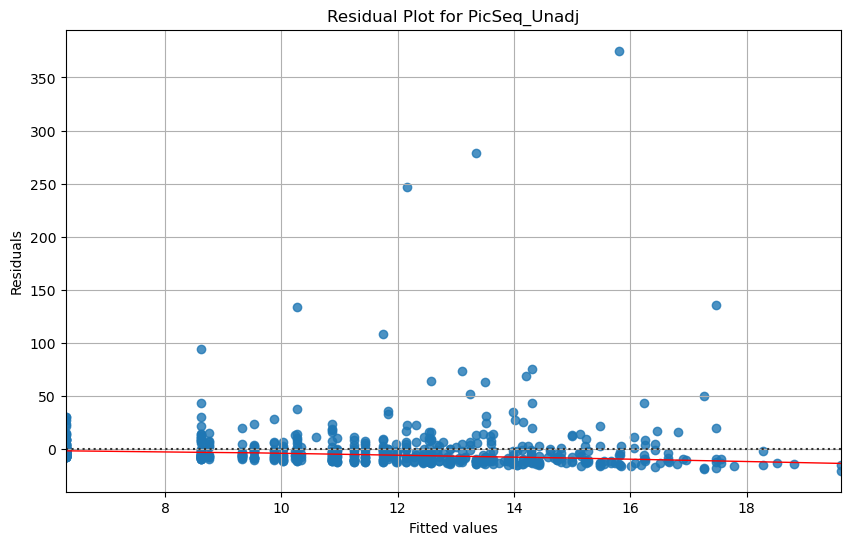

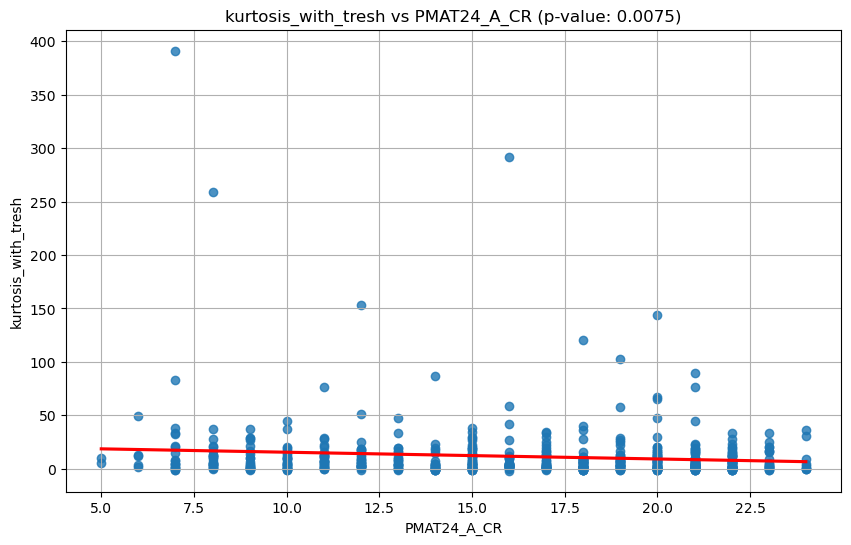

Regression summary for PMAT24_A_CR:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.012
Model:                             OLS   Adj. R-squared:                  0.011
Method:                  Least Squares   F-statistic:                     7.200
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00750
Time:                         17:39:48   Log-Likelihood:                -2744.8
No. Observations:                  581   AIC:                             5494.
Df Residuals:                      579   BIC:                             5502.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

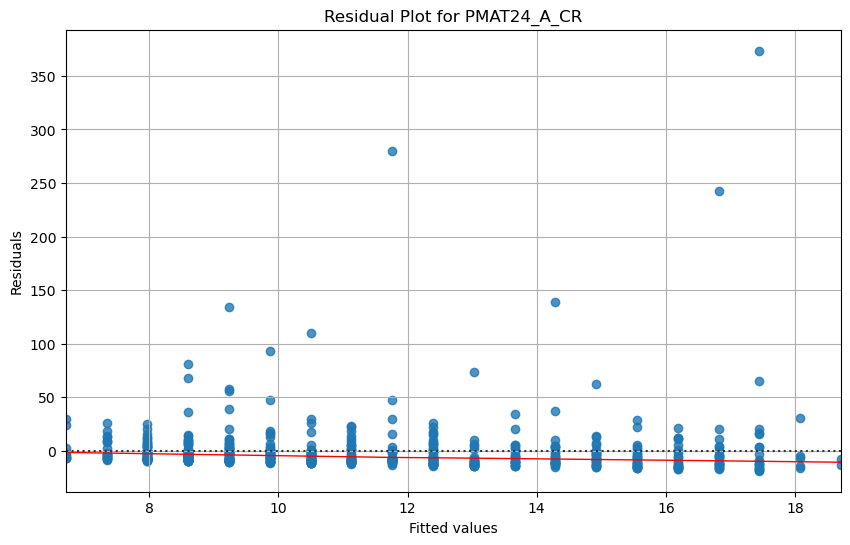

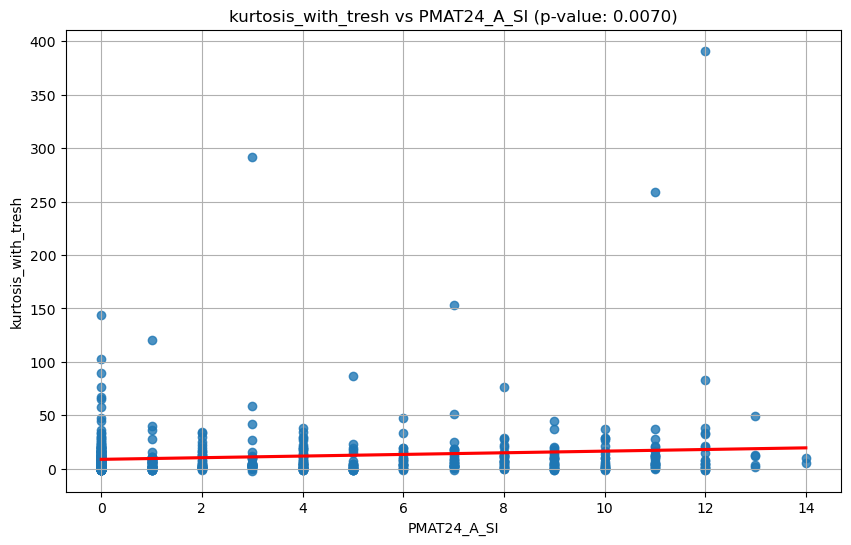

Regression summary for PMAT24_A_SI:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.013
Model:                             OLS   Adj. R-squared:                  0.011
Method:                  Least Squares   F-statistic:                     7.332
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):            0.00697
Time:                         17:39:48   Log-Likelihood:                -2744.7
No. Observations:                  581   AIC:                             5493.
Df Residuals:                      579   BIC:                             5502.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
con

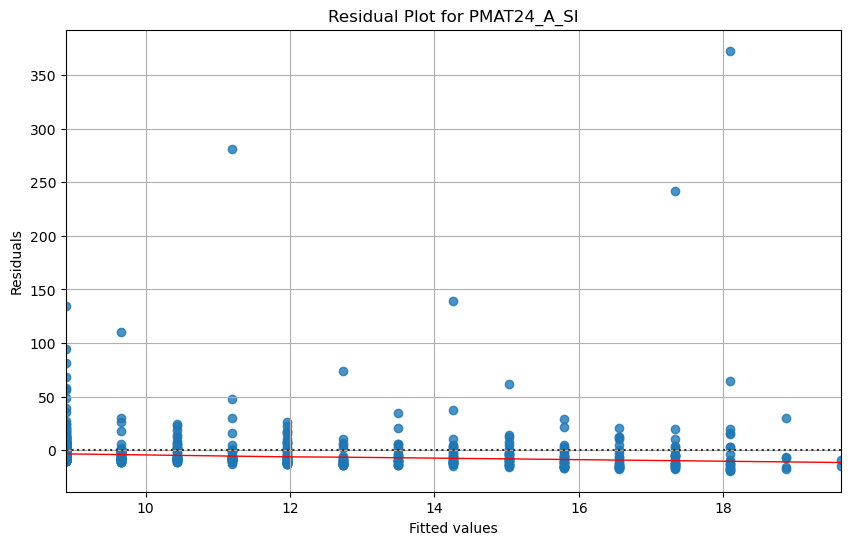

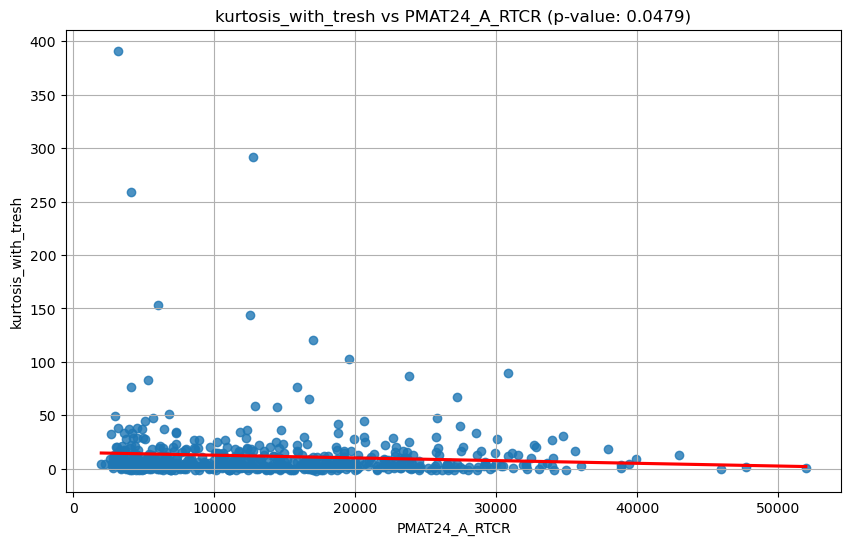

Regression summary for PMAT24_A_RTCR:

                             OLS Regression Results                            
Dep. Variable:     kurtosis_with_tresh   R-squared:                       0.007
Model:                             OLS   Adj. R-squared:                  0.005
Method:                  Least Squares   F-statistic:                     3.929
Date:                 Sun, 14 Jul 2024   Prob (F-statistic):             0.0479
Time:                         17:39:48   Log-Likelihood:                -2746.4
No. Observations:                  581   AIC:                             5497.
Df Residuals:                      579   BIC:                             5506.
Df Model:                            1                                         
Covariance Type:             nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------

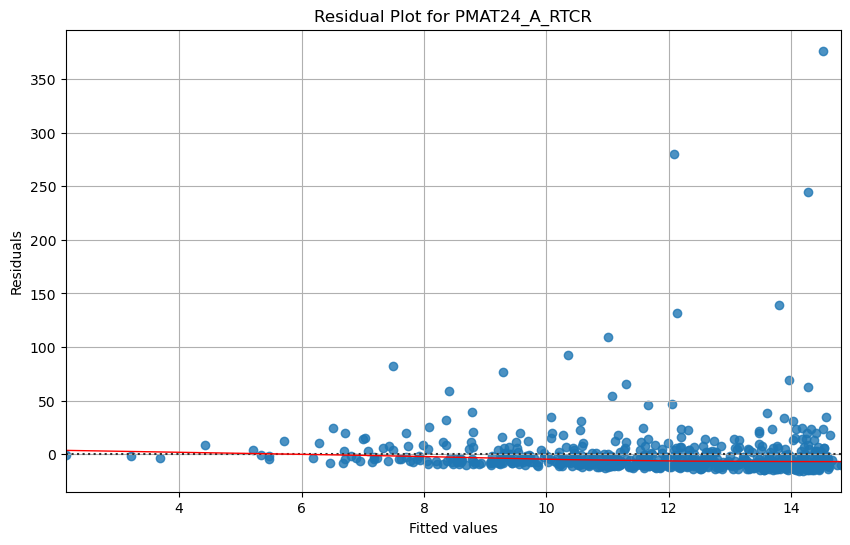

In [253]:
columns_of_interest = ['PicSeq_Unadj','PMAT24_A_CR', 'PMAT24_A_SI', 'PMAT24_A_RTCR']

# Convert specified columns to numeric, errors='coerce' will turn non-convertible values to NaN
for col in columns_of_interest:
    if col in merged_df_rest1_female.columns:
        merged_df_rest1_female[col] = pd.to_numeric(merged_df_rest1_female[col], errors='coerce')

statistics_of_interest = ['skewness_no_tresh','skewness_with_tresh','kurtosis_no_tresh', 'kurtosis_with_tresh']      
for n in range(len(statistics_of_interest)):
    for col in columns_of_interest:
        if col in merged_df_rest1_female.columns:
            df = merged_df_rest1_female[[statistics_of_interest[n], col]].dropna()
            if not df.empty: 
                X = sm.add_constant(df[col])
                y = df[statistics_of_interest[n]]
                model = sm.OLS(y, X).fit()
                p_value = model.pvalues[col]
                summary = model.summary()
                plt.figure(figsize=(10, 6))
                sns.regplot(x=col, y= statistics_of_interest[n], data=df, ci=None, line_kws={"color": "red"})
                plt.title(f'{statistics_of_interest[n]} vs {col} (p-value: {p_value:.4f})')
                plt.xlabel(col)
                plt.ylabel(statistics_of_interest[n])
                plt.grid(True)
                plt.show()
                print(f"Regression summary for {col}:\n")
                print(summary)
                residuals = model.resid
                fitted = model.fittedvalues
                plt.figure(figsize=(10, 6))
                sns.residplot(x=fitted, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 1})
                plt.title(f'Residual Plot for {col}')
                plt.xlabel('Fitted values')
                plt.ylabel('Residuals')
                plt.grid(True)
                plt.show()          